# Group 6 - Painting Classification

On this notebook, we start by getting the dataset generated in the first notebook (EDA) and then create our own models from scratch.

To track the evolution of the different model results we used Weights and Biases (W&B).

## 0. Setup

In [1]:
# Install dependencies 
!pip install wandb -q

In [2]:
# Import all libraries we'll need
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks, regularizers
from keras import Model, Input
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, f1_score, confusion_matrix
import seaborn as sns
from collections import Counter

# Import Models
from keras.applications.vgg16 import VGG16
from keras.applications import EfficientNetB0
from keras.applications import EfficientNetB3
from keras.applications import ResNet50


# Resnet Preprocess
from keras.applications.resnet import preprocess_input as resnet_preprocess

# W&B imports
import wandb
from wandb.integration.keras import WandbMetricsLogger

# Global settings
IMG_SIZE = 224 #resnet precisa de 224, B0 precisa de 224,VGG16 224, B3 precisa de 300
BATCH_SIZE = 64
NUM_CLASSES = 23
SEED = 6666
AUTOTUNE = tf.data.AUTOTUNE

tf.random.set_seed(SEED)
np.random.seed(SEED)
tf.keras.utils.set_random_seed(SEED)

2026-04-24 09:53:00.392846: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1777024380.598707      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1777024380.654570      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1777024381.143468      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777024381.143505      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777024381.143508      55 computation_placer.cc:177] computation placer alr

In [3]:
# Login to W&B
wandb.login()

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:

  2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Create a new API key at: https://wandb.ai/authorize?ref=models
wandb: Store your API key securely and do not share it.
wandb: Paste your API key and hit enter:

  ········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: adriananetoribeiro (miguelcorreia4-nova-information-management-school) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

## 1. Load the data

In [4]:
# This folder should contain train/, val/, test/ subfolders

split_dir = "/kaggle/input/datasets/drir04/wikiart-split/wikiart_split"

train_dir = os.path.join(split_dir, "train")
val_dir = os.path.join(split_dir, "val")
test_dir = os.path.join(split_dir, "test")

# Quick check that the paths are correct
for d in [train_dir, val_dir, test_dir]:
    n_classes = len(os.listdir(d))
    n_images = sum(len(os.listdir(os.path.join(d, c))) for c in os.listdir(d))
    print(f"{os.path.basename(d):5s}: {n_classes} classes, {n_images} images")

train: 23 classes, 8002 images
val  : 23 classes, 2670 images
test : 23 classes, 2668 images


In [5]:
# Load images from the split folders

train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    seed=SEED,
    label_mode='int',
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    seed=SEED,
    label_mode='int',
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    seed=SEED,
    label_mode='int',
)

# class_names is the list of painter names, in the order Keras assigned them
class_names = train_ds.class_names
print(f"\nClasses ({len(class_names)}):")
for i, name in enumerate(class_names):
    print(f"  {i:2d}: {name}")

Found 8002 files belonging to 23 classes.


I0000 00:00:1777024436.354369      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1777024436.360427      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Found 2670 files belonging to 23 classes.
Found 2668 files belonging to 23 classes.

Classes (23):
   0: Albrecht_Durer
   1: Boris_Kustodiev
   2: Camille_Pissarro
   3: Childe_Hassam
   4: Claude_Monet
   5: Edgar_Degas
   6: Eugene_Boudin
   7: Gustave_Dore
   8: Ilya_Repin
   9: Ivan_Aivazovsky
  10: Ivan_Shishkin
  11: John_Singer_Sargent
  12: Marc_Chagall
  13: Martiros_Saryan
  14: Nicholas_Roerich
  15: Pablo_Picasso
  16: Paul_Cezanne
  17: Pierre_Auguste_Renoir
  18: Pyotr_Konchalovsky
  19: Raphael_Kirchner
  20: Rembrandt
  21: Salvador_Dali
  22: Vincent_van_Gogh


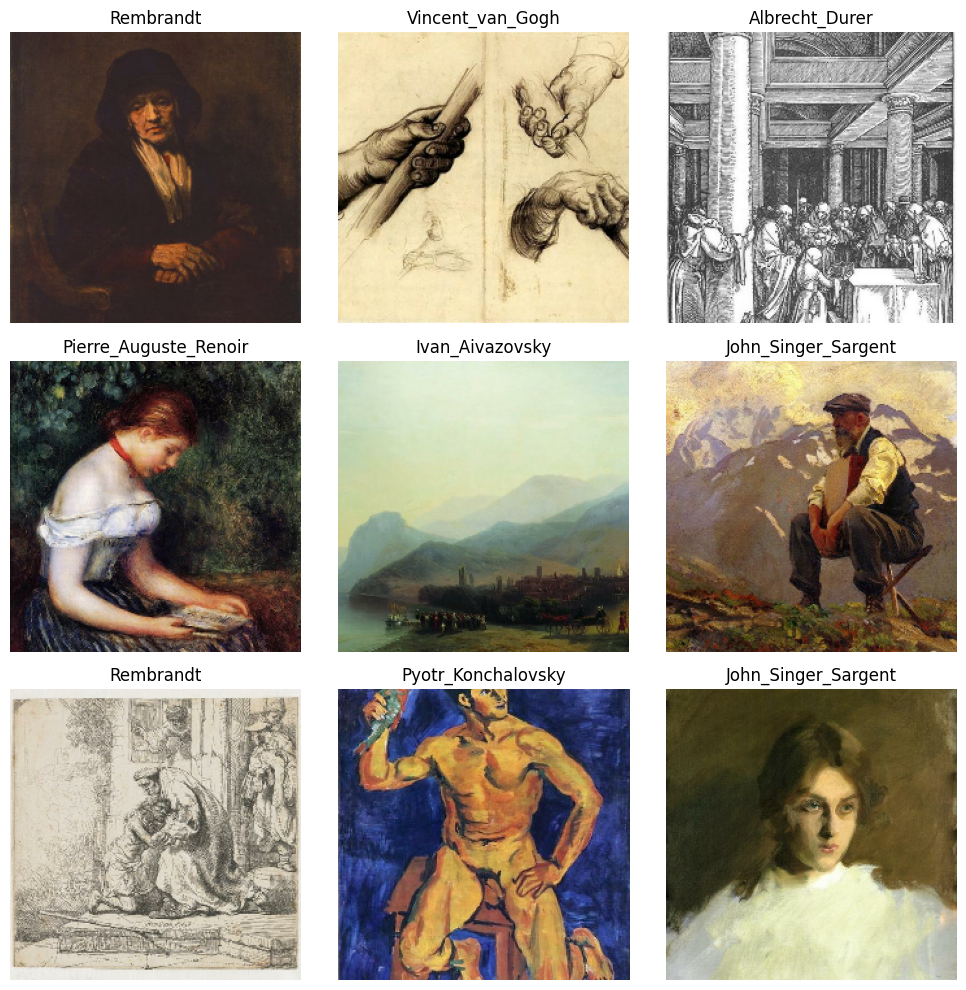

In [6]:
# Code adapted from: https://keras.io/examples/vision/image_classification_from_scratch/

# Visualize the first 9 paintings in the dataset
plt.figure(figsize=(10,10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3,3,i+1)

    img = images[i].numpy().astype("uint8")
    plt.imshow(img)
    label_idx = labels[i].numpy()         # Converts one-hot encoded label to integer
    plt.title(class_names[label_idx])     # Gets the painter's name based on its index
    plt.axis("off")
plt.tight_layout()
plt.show()

### 1.1 Class weights

In [7]:
# Count how many images each painter has in the training set
train_labels = []
for _, labels in train_ds:
    train_labels.extend(labels.numpy())
train_labels = np.array(train_labels)

label_counts = Counter(train_labels)
total_samples = len(train_labels)

# Compute weights: rarer classes get higher weights
# Formula: total_samples / (num_classes * count_for_this_class)
class_weights = {
    cls: total_samples / (NUM_CLASSES * count)
    for cls, count in label_counts.items()
}

print(f"{'Painter':30s}  {'Samples':>8s}  {'Weight':>8s}")
print("-" * 50)
for cls_idx in sorted(class_weights.keys()):
    print(f"{class_names[cls_idx]:30s}  {label_counts[cls_idx]:8d}  {class_weights[cls_idx]:8.3f}")

Painter                          Samples    Weight
--------------------------------------------------
Albrecht_Durer                       348     1.000
Boris_Kustodiev                      266     1.308
Camille_Pissarro                     373     0.933
Childe_Hassam                        231     1.506
Claude_Monet                         560     0.621
Edgar_Degas                          257     1.354
Eugene_Boudin                        233     1.493
Gustave_Dore                         317     1.098
Ilya_Repin                           227     1.533
Ivan_Aivazovsky                      242     1.438
Ivan_Shishkin                        218     1.596
John_Singer_Sargent                  329     1.057
Marc_Chagall                         322     1.080
Martiros_Saryan                      242     1.438
Nicholas_Roerich                     764     0.455
Pablo_Picasso                        320     1.087
Paul_Cezanne                         244     1.426
Pierre_Auguste_Renoir          

In [8]:
# Performance optimization
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

## 2. Helper Functions

These functions will be reused across all models to evaluate performance and visualize results.

In [9]:
def evaluate_model(model, dataset, class_names, dataset_name="Validation"):
    """
    Run the model on a dataset and compute metrics.
    Returns true labels, predicted labels, weighted F1, and macro F1.
    """
    y_true = []
    y_pred = []

    for images, labels in dataset:
        predictions = model.predict(images, verbose=0)
        y_true.extend(labels.numpy())
        y_pred.extend(np.argmax(predictions, axis=1))

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    f1_weighted = f1_score(y_true, y_pred, average='weighted')
    f1_macro = f1_score(y_true, y_pred, average='macro')

    print(f"\n{dataset_name} Results:")
    print(f"  Weighted F1: {f1_weighted:.4f}")
    print(f"  Macro F1:    {f1_macro:.4f}")
    print(f"\nPer-class report:")
    print(classification_report(y_true, y_pred, target_names=class_names))

    return y_true, y_pred, f1_weighted, f1_macro


def plot_confusion_matrix(y_true, y_pred, class_names, title="Confusion Matrix"):
    """
    Plot a normalized confusion matrix.
    Each cell shows the proportion of true class X that was predicted as class Y.
    The diagonal shows correct predictions — off-diagonal shows confusions.
    """
    cm = confusion_matrix(y_true, y_pred, normalize='true')
    fig, ax = plt.subplots(figsize=(14, 12))
    sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=ax)
    ax.set_xlabel('Predicted', fontsize=12)
    ax.set_ylabel('True', fontsize=12)
    ax.set_title(title, fontsize=14, fontweight='bold')
    plt.xticks(rotation=55, ha='right', fontsize=8)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    plt.show()
    return fig


def plot_training_history(history, title="Training History"):
    """
    Plot training curves: loss, accuracy, and F1 scores over epochs.
    A large gap between train and val curves indicates overfitting.
    """
    has_f1 = 'val_f1_weighted' in history.history

    n_plots = 3 if has_f1 else 2
    fig, axes = plt.subplots(1, n_plots, figsize=(6 * n_plots, 5))

    axes[0].plot(history.history['loss'], label='Train Loss')
    axes[0].plot(history.history['val_loss'], label='Val Loss')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title(f'{title} — Loss')
    axes[0].legend()

    axes[1].plot(history.history['accuracy'], label='Train Accuracy')
    axes[1].plot(history.history['val_accuracy'], label='Val Accuracy')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Accuracy')
    axes[1].set_title(f'{title} — Accuracy')
    axes[1].legend()

    if has_f1:
        axes[2].plot(history.history['val_f1_weighted'], label='Weighted F1')
        axes[2].plot(history.history['val_f1_macro'], label='Macro F1')
        axes[2].set_xlabel('Epoch')
        axes[2].set_ylabel('F1 Score')
        axes[2].set_title(f'{title} — F1 Scores')
        axes[2].legend()

    plt.tight_layout()
    plt.show()
    return fig


class F1Callback(callbacks.Callback):
    """
    Calculates weighted and macro F1 on the validation set at the end of each epoch.
    Results are added to the Keras logs dict, which WandbMetricsLogger picks up automatically.
    """
    def __init__(self, val_dataset):
        super().__init__()
        self.val_dataset = val_dataset

    def on_epoch_end(self, epoch, logs=None):
        y_true = []
        y_pred = []

        for images, labels in self.val_dataset:
            predictions = self.model.predict(images, verbose=0)
            y_true.extend(labels.numpy())
            y_pred.extend(np.argmax(predictions, axis=1))

        f1_w = f1_score(y_true, y_pred, average='weighted')
        f1_m = f1_score(y_true, y_pred, average='macro')

        # Add to Keras logs — WandbMetricsLogger will pick these up automatically
        logs['val_f1_weighted'] = f1_w
        logs['val_f1_macro'] = f1_m

        print(f" — val_f1_weighted: {f1_w:.4f} — val_f1_macro: {f1_m:.4f}")

In [10]:
def sparse_focal_loss(gamma=2.0, alpha=None):
    if alpha is None:
        alpha_tensor = None
    else:
        alpha_tensor = tf.constant(alpha, dtype=tf.float32)

    def loss_fn(y_true, y_pred):
        y_true = tf.cast(tf.reshape(y_true, [-1]), tf.int32)
        ce = tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred)
        # Get the probability of the true class
        probs = tf.reduce_max(y_pred * tf.one_hot(y_true, NUM_CLASSES), axis=-1)
        focal_weight = tf.pow(1.0 - probs, gamma)
        if alpha_tensor is not None:
            alpha_weight = tf.gather(alpha_tensor, y_true)
            focal_weight = focal_weight * alpha_weight
        return focal_weight * ce

    return loss_fn

## 3. Scratch Models

We first tried a model version with only 3 blocks, then tried with 5 and realized the results were better. From then on out we tried to improve the 5 blocks version as best as we could by trying on different parameters.

After finding our best model, we tried applying augmentation but the results didn't improve.

Finally we also tried using Optuna to find the best parameters.

Here's a list of all the models trained in this notebook:
- [3 blocks](#1)
- [5 blocks](#2)
- [5 blocks + L2](#3)
- [5 blocks + L2 + higher dropout](#4)
- [5 blocks + L2 + deeper classifier](#5)
- [5 blocks + augmentation (the one shown is Contrast=0.3 + Sharpness=0.5, but others were also tried)](#6)
- [Optuna](#7)
- [Optuna + L2](#8)
- [Optune + augmentation](#9)

<a id="1" />

### 3.1 Initial model with 3 blocks

In [13]:
wandb.init(
    project="wikiart-scratch",       # All scratch models go under this project
    name="3block",          # Name for this specific run
    id=wandb.util.generate_id(),
    config={                         # Hyperparameters to track
        "architecture": "3-block CNN",
        "img_size": IMG_SIZE,
        "batch_size": BATCH_SIZE,
        "filters": [32, 64, 128],
        "dense_units": 256,
        "dropout": 0.3,
        "augmentation": "none",
        "optimizer": "adam",
        "learning_rate": 0.001,
    }
)

In [14]:
# Build the model
model_3block = keras.Sequential([
    # Input shape: 128x128 pixels, 3 colour channels (RGB)
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),

    # Normalize pixel values from [0, 255] to [0, 1]
    # This helps the optimizer converge faster
    layers.Rescaling(1./255),

    # Block 1: 32 filters, each 3x3 pixels
    # After MaxPooling: 128x128 -> 64x64
    layers.Conv2D(32, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 2: 64 filters
    # After MaxPooling: 64x64 -> 32x32
    layers.Conv2D(64, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 3: 128 filters
    # After MaxPooling: 32x32 -> 16x16
    layers.Conv2D(128, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Convert 2D feature maps to 1D vector
    layers.GlobalAveragePooling2D(),

    # Classification head
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(NUM_CLASSES, activation='softmax'),
])

model_3block.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

# Show the model architecture
model_3block.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 23)             │         5,911 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 133,079 (519.84 KB)

 Trainable params: 132,631 (518.09 KB)

 Non-trainable params: 448 (1.75 KB)

In [15]:
# Train the model
# max epochs = 100, but EarlyStopping will stop it sooner if val_loss stops improving

history = model_3block.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    class_weight=class_weights,
    callbacks=[
        # Stop training if val_loss doesn't improve for 10 epochs
        # restore_best_weights=True means we keep the best model, not the last one
        callbacks.EarlyStopping(
            monitor='val_loss',
            patience=20,
            restore_best_weights=True,
            verbose=1
        ),
        # Halve the learning rate if val_loss doesn't improve for 5 epochs
        # This lets the model make finer adjustments as it gets closer to a good solution
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        ),
        # Calculate F1 scores on full validation set at end of each epoch
        F1Callback(val_ds),
        # Log metrics to W&B automatically every epoch
        WandbMetricsLogger(),
    ],
)

Epoch 1/100


I0000 00:00:1776986426.335563     135 service.cc:152] XLA service 0x7c9ef4213e60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1776986426.335601     135 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1776986426.335605     135 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1776986427.368850     135 cuda_dnn.cc:529] Loaded cuDNN version 91002


  1/126 ━━━━━━━━━━━━━━━━━━━━ 25:58 12s/step - accuracy: 0.0312 - loss: 3.2438

I0000 00:00:1776986436.382022     135 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.1464 - loss: 2.9005

2026-04-23 23:20:55.494879: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-23 23:20:55.636731: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - accuracy: 0.1468 - loss: 2.8992 — val_f1_weighted: 0.0018 — val_f1_macro: 0.0026
126/126 ━━━━━━━━━━━━━━━━━━━━ 50s 297ms/step - accuracy: 0.1472 - loss: 2.8979 - val_accuracy: 0.0303 - val_loss: 3.7795 - learning_rate: 0.0010 - val_f1_weighted: 0.0018 - val_f1_macro: 0.0026
Epoch 2/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - accuracy: 0.2533 - loss: 2.4787 — val_f1_weighted: 0.0018 — val_f1_macro: 0.0026
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - accuracy: 0.2536 - loss: 2.4776 - val_accuracy: 0.0303 - val_loss: 4.4626 - learning_rate: 0.0010 - val_f1_weighted: 0.0018 - val_f1_macro: 0.0026
Epoch 3/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.3045 - loss: 2.3051 — val_f1_weighted: 0.0243 — val_f1_macro: 0.0235
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - accuracy: 0.3046 - loss: 2.3045 - val_accuracy: 0.0517 - val_loss: 3.6762 - learning_rate: 0.0010 - val_f1_weighted: 0.0243 - val_f1_macro: 0.0235
Epoch 4/100
125/126

In [17]:
train_results = evaluate_model(model_3block, train_ds, class_names, "Train")
val_results = evaluate_model(model_3block, val_ds, class_names, "Validation")


Train Results:
  Weighted F1: 0.6816
  Macro F1:    0.6744

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.70      0.72      0.71       348
      Boris_Kustodiev       0.65      0.58      0.62       266
     Camille_Pissarro       0.63      0.54      0.58       373
        Childe_Hassam       0.47      0.71      0.56       231
         Claude_Monet       0.73      0.62      0.67       560
          Edgar_Degas       0.49      0.63      0.55       257
        Eugene_Boudin       0.67      0.88      0.76       233
         Gustave_Dore       0.94      0.94      0.94       317
           Ilya_Repin       0.56      0.62      0.58       227
      Ivan_Aivazovsky       0.78      0.93      0.85       242
        Ivan_Shishkin       0.72      0.88      0.79       218
  John_Singer_Sargent       0.60      0.67      0.63       329
         Marc_Chagall       0.65      0.67      0.66       322
      Martiros_Saryan       0.63      

#### 3.1.1 Evaluate model

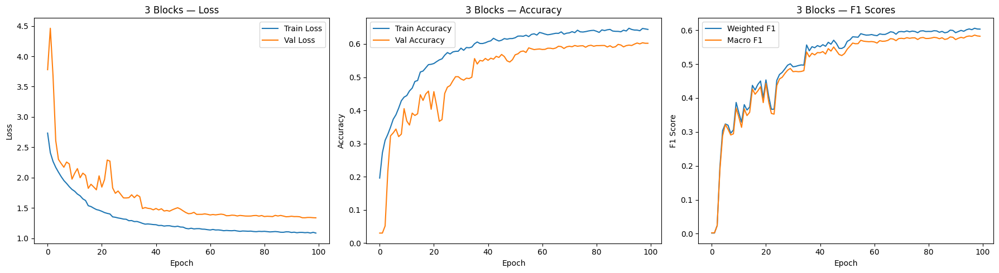

In [18]:
# Plot training curves
plot_training_history(history, "3 Blocks");

In [19]:
# Evaluate on validation set
y_true, y_pred, f1_weighted, f1_macro = evaluate_model(model_3block, val_ds, class_names)


Validation Results:
  Weighted F1: 0.6031
  Macro F1:    0.5822

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.66      0.71      0.68       116
      Boris_Kustodiev       0.48      0.54      0.51        89
     Camille_Pissarro       0.59      0.48      0.53       124
        Childe_Hassam       0.40      0.64      0.49        77
         Claude_Monet       0.65      0.55      0.59       187
          Edgar_Degas       0.38      0.48      0.42        86
        Eugene_Boudin       0.58      0.78      0.66        78
         Gustave_Dore       0.92      0.91      0.91       106
           Ilya_Repin       0.48      0.51      0.50        76
      Ivan_Aivazovsky       0.70      0.84      0.76        81
        Ivan_Shishkin       0.68      0.70      0.69        73
  John_Singer_Sargent       0.57      0.61      0.59       110
         Marc_Chagall       0.50      0.55      0.53       107
      Martiros_Saryan       0.45 

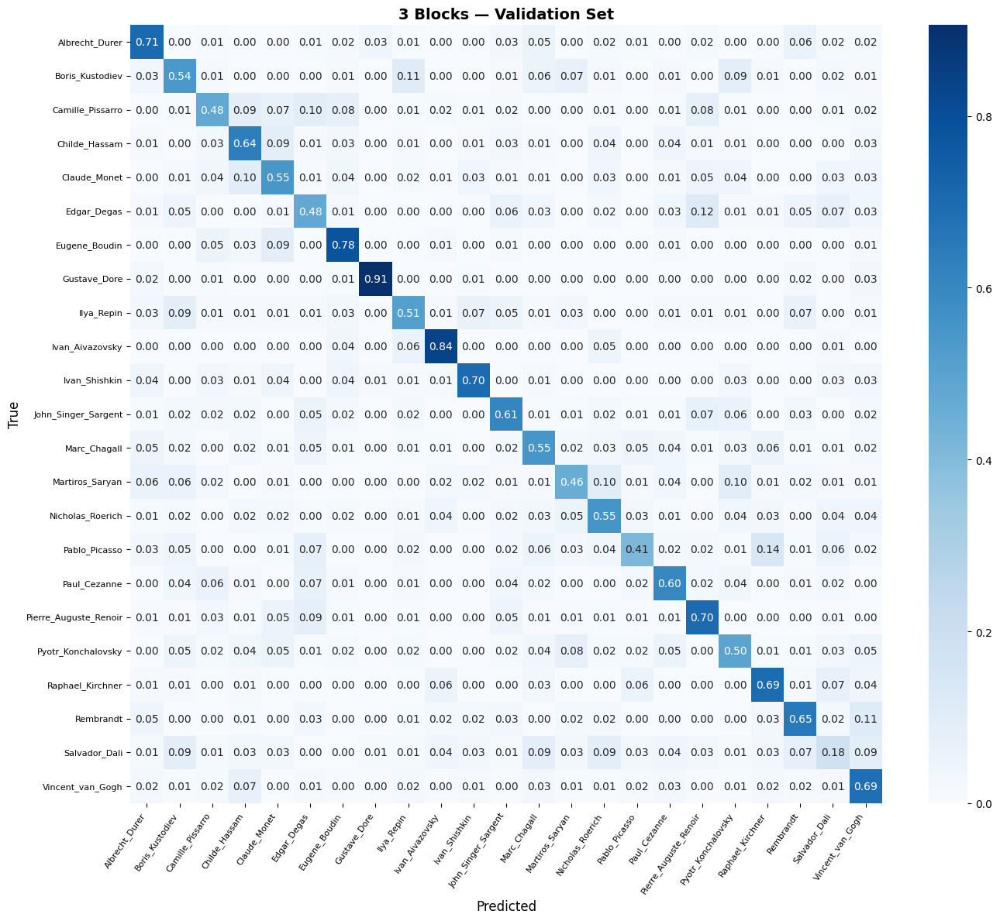

In [20]:
# Confusion matrix — shows which painters the model confuses
plot_confusion_matrix(y_true, y_pred, class_names, "3 Blocks — Validation Set");

In [21]:
# Log final metrics to W&B and finish this run
wandb.log({"val_f1_weighted": f1_weighted, "val_f1_macro": f1_macro})
wandb.finish()

epoch/accuracy,▁▃▄▅▅▆▆▆▆▆▇▇▇▇▇▇████████████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,█████▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▇▇▆▆▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▁▃▂▃▄▄▃▅▅▇▇▇▇▇▇▇▇▇█████████████████████
epoch/val_f1_macro,▁▃▄▅▅▆▅▆▆▆▇▇▇▇▇▇▇█▇█████████████████████
epoch/val_f1_weighted,▁▄▅▅▅▅▅▆▆▅▇▇▇▇▇▇▇▇▇▇████████████████████
epoch/val_loss,▆█▆▃▃▃▃▂▂▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_f1_weighted,▁
epoch/accuracy,0.64396


<a id="2" />

### 3.2 Model with 5 blocks

In [22]:
wandb.init(
    project="wikiart-scratch",
    name="5block",
    id=wandb.util.generate_id(),
    config={
        "architecture": "5-block CNN",
        "img_size": IMG_SIZE,
        "batch_size": BATCH_SIZE,
        "filters": [32, 64, 128, 256, 512],
        "dense_units": 256,
        "dropout": 0.3,
        "l2": 0,
        "augmentation": "none",
        "optimizer": "adam",
        "learning_rate": 0.001,
    }
)

In [23]:
model_5block = keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    layers.Rescaling(1./255),

    # Block 1: 128x128 -> 64x64
    layers.Conv2D(32, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 2: 64x64 -> 32x32
    layers.Conv2D(64, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 3: 32x32 -> 16x16
    layers.Conv2D(128, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 4: 16x16 -> 8x8
    layers.Conv2D(256, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 5: 8x8 -> 4x4
    layers.Conv2D(512, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Classifier
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(NUM_CLASSES, activation='softmax'),
])

model_5block.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

model_5block.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_9 (Activation)       │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 14, 14, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_10 (Activation)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │             

 Total params: 1,709,783 (6.52 MB)

 Trainable params: 1,707,799 (6.51 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [24]:
history = model_5block.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    class_weight=class_weights,
    callbacks=[
        # Stop training if val_loss doesn't improve for 10 epochs
        # restore_best_weights=True means we keep the best model, not the last one
        callbacks.EarlyStopping(
            monitor='val_loss',
            patience=20,
            restore_best_weights=True,
            verbose=1
        ),
        # Halve the learning rate if val_loss doesn't improve for 5 epochs
        # This lets the model make finer adjustments as it gets closer to a good solution
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        ),
        # Calculate F1 scores on full validation set at end of each epoch
        F1Callback(val_ds),
        # Log metrics to W&B automatically every epoch
        WandbMetricsLogger(),
    ],
)

Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.1615 - loss: 2.9498 — val_f1_weighted: 0.0018 — val_f1_macro: 0.0026
126/126 ━━━━━━━━━━━━━━━━━━━━ 43s 258ms/step - accuracy: 0.1619 - loss: 2.9479 - val_accuracy: 0.0303 - val_loss: 4.9949 - learning_rate: 0.0010 - val_f1_weighted: 0.0018 - val_f1_macro: 0.0026
Epoch 2/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.2636 - loss: 2.4432 — val_f1_weighted: 0.0103 — val_f1_macro: 0.0125
126/126 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - accuracy: 0.2639 - loss: 2.4422 - val_accuracy: 0.0360 - val_loss: 5.2071 - learning_rate: 0.0010 - val_f1_weighted: 0.0103 - val_f1_macro: 0.0125
Epoch 3/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.3200 - loss: 2.2511 — val_f1_weighted: 0.0597 — val_f1_macro: 0.0514
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 197ms/step - accuracy: 0.3200 - loss: 2.2507 - val_accuracy: 0.0933 - val_loss: 3.8310 - learning_rate: 0.0010 - val_f1_weighted: 0.0597 - val_f1_macro: 0.0514
Epoch 4

In [26]:
train_results = evaluate_model(model_5block, train_ds, class_names, "Train")
val_results = evaluate_model(model_5block, val_ds, class_names, "Validation")


Train Results:
  Weighted F1: 0.9128
  Macro F1:    0.9197

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.89      0.90      0.90       348
      Boris_Kustodiev       0.89      0.92      0.90       266
     Camille_Pissarro       0.82      0.88      0.85       373
        Childe_Hassam       0.86      0.98      0.92       231
         Claude_Monet       0.89      0.84      0.87       560
          Edgar_Degas       0.87      0.94      0.91       257
        Eugene_Boudin       0.92      0.99      0.95       233
         Gustave_Dore       0.99      0.99      0.99       317
           Ilya_Repin       0.86      0.91      0.88       227
      Ivan_Aivazovsky       0.98      0.99      0.98       242
        Ivan_Shishkin       0.93      0.99      0.96       218
  John_Singer_Sargent       0.93      0.94      0.93       329
         Marc_Chagall       0.92      0.96      0.94       322
      Martiros_Saryan       0.90      

#### 3.2.1 Evaluate model

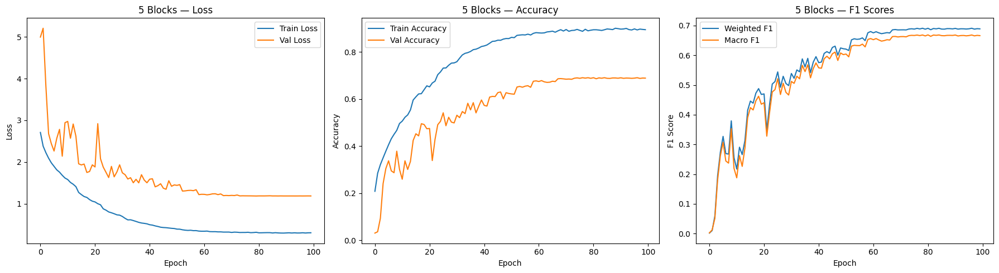

In [27]:
plot_training_history(history, "5 Blocks");

In [28]:
y_true, y_pred, f1_weighted, f1_macro = evaluate_model(model_5block, val_ds, class_names)


Validation Results:
  Weighted F1: 0.6876
  Macro F1:    0.6649

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.64      0.74      0.69       116
      Boris_Kustodiev       0.55      0.62      0.58        89
     Camille_Pissarro       0.59      0.63      0.61       124
        Childe_Hassam       0.54      0.69      0.61        77
         Claude_Monet       0.69      0.65      0.67       187
          Edgar_Degas       0.57      0.58      0.58        86
        Eugene_Boudin       0.65      0.71      0.67        78
         Gustave_Dore       0.90      0.92      0.91       106
           Ilya_Repin       0.44      0.51      0.48        76
      Ivan_Aivazovsky       0.89      0.89      0.89        81
        Ivan_Shishkin       0.82      0.74      0.78        73
  John_Singer_Sargent       0.69      0.67      0.68       110
         Marc_Chagall       0.60      0.64      0.62       107
      Martiros_Saryan       0.60 

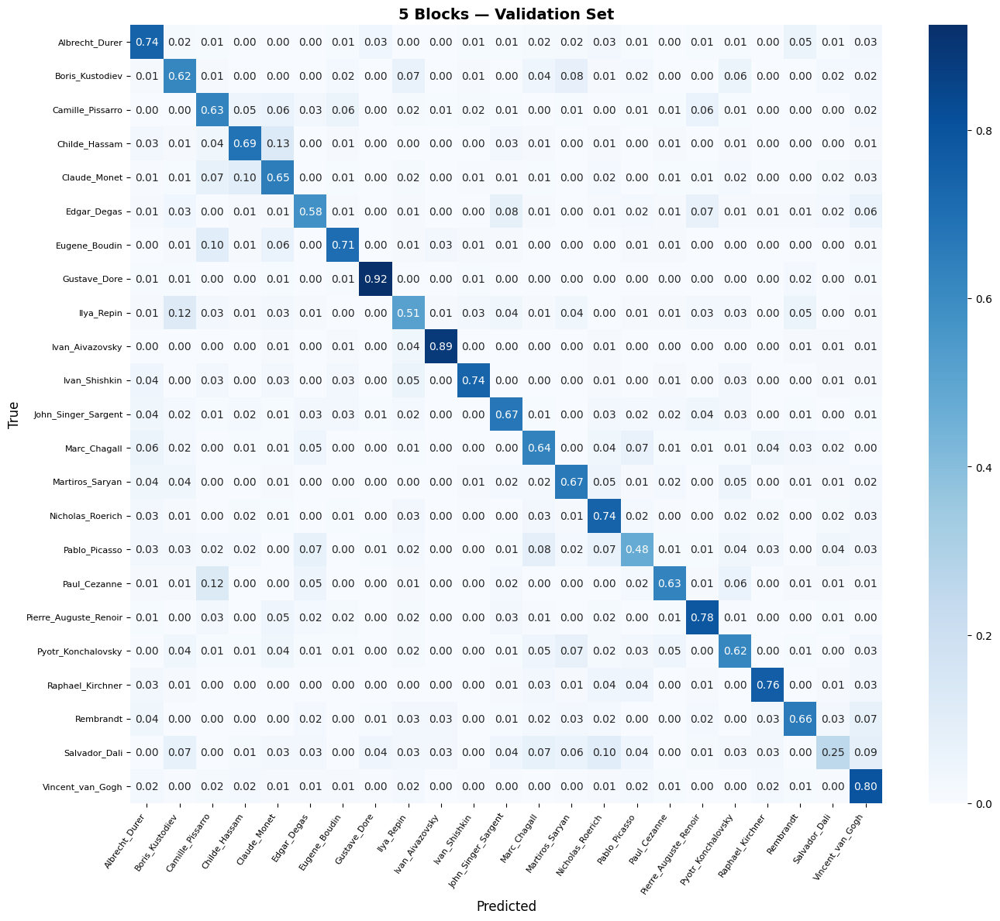

In [29]:
plot_confusion_matrix(y_true, y_pred, class_names, "5 Blocks — Validation Set");

In [30]:
wandb.log({"val_f1_weighted": f1_weighted, "val_f1_macro": f1_macro})
wandb.finish()

epoch/accuracy,▁▂▂▃▃▄▅▅▅▅▇▇▇▇▇▇▇███████████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▇▇▇████
epoch/learning_rate,██████▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▆▆▆▆▅▅▄▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▁▂▃▄▄▃▄▄▅▆▄▅▆▆▆▆▆▇▇▇███████████████████
epoch/val_f1_macro,▁▁▃▄▄▅▃▄▅▅▄▅▆▆▆▆▆▆▇▇▇▇▇█████████████████
epoch/val_f1_weighted,▁▂▃▃▃▄▄▅▆▆▅▆▆▆▆▇▇▇▇▇████████████████████
epoch/val_loss,█▆▄▃▄▄▄▄▂▂▂▂▂▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_f1_weighted,▁
epoch/accuracy,0.89478


<a id="3" />

### 3.3 Model with 5 blocks and L2 regularization

In [32]:
wandb.init(
    project="wikiart-scratch",
    name="5block_L2",
    id=wandb.util.generate_id(),
    config={
        "architecture": "5-block CNN + L2",
        "img_size": IMG_SIZE,
        "batch_size": BATCH_SIZE,
        "filters": [32, 64, 128, 256, 512],
        "dense_units": 256,
        "dropout": 0.3,
        "l2": 0.001,
        "augmentation": "none",
        "optimizer": "adam",
        "learning_rate": 0.001,
    }
)

In [33]:
model_5block_L2 = keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    layers.Rescaling(1./255),

    # Block 1: 128x128 -> 64x64
    layers.Conv2D(32, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 2: 64x64 -> 32x32
    layers.Conv2D(64, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 3: 32x32 -> 16x16
    layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 4: 16x16 -> 8x8
    layers.Conv2D(256, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 5: 8x8 -> 4x4
    layers.Conv2D(512, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Classifier
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.3),
    layers.Dense(NUM_CLASSES, activation='softmax'),
])

model_5block_L2.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

model_5block_L2.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_13 (Activation)      │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_14 (Activation)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_15 (Activation)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_16 (Activation)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 14, 14, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_17 (Activation)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │             

 Total params: 1,709,783 (6.52 MB)

 Trainable params: 1,707,799 (6.51 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [34]:
history = model_5block_L2.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    class_weight=class_weights,
    callbacks=[
        callbacks.EarlyStopping(
            monitor='val_loss',
            patience=20,
            restore_best_weights=True,
            verbose=1
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        ),
        F1Callback(val_ds),
        WandbMetricsLogger(),
    ],
)

Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.1651 - loss: 3.9174 — val_f1_weighted: 0.0025 — val_f1_macro: 0.0033
126/126 ━━━━━━━━━━━━━━━━━━━━ 42s 263ms/step - accuracy: 0.1654 - loss: 3.9151 - val_accuracy: 0.0307 - val_loss: 5.5084 - learning_rate: 0.0010 - val_f1_weighted: 0.0025 - val_f1_macro: 0.0033
Epoch 2/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.2574 - loss: 3.2147 — val_f1_weighted: 0.0118 — val_f1_macro: 0.0143
126/126 ━━━━━━━━━━━━━━━━━━━━ 26s 203ms/step - accuracy: 0.2577 - loss: 3.2129 - val_accuracy: 0.0468 - val_loss: 5.2432 - learning_rate: 0.0010 - val_f1_weighted: 0.0118 - val_f1_macro: 0.0143
Epoch 3/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.2997 - loss: 2.8579 — val_f1_weighted: 0.0299 — val_f1_macro: 0.0313
126/126 ━━━━━━━━━━━━━━━━━━━━ 26s 203ms/step - accuracy: 0.2997 - loss: 2.8571 - val_accuracy: 0.0753 - val_loss: 4.2099 - learning_rate: 0.0010 - val_f1_weighted: 0.0299 - val_f1_macro: 0.0313
Epoch 4

In [35]:
train_results = evaluate_model(model_5block_L2, train_ds, class_names, "Train")
val_results = evaluate_model(model_5block_L2, val_ds, class_names, "Validation")


Train Results:
  Weighted F1: 0.9765
  Macro F1:    0.9812

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.97      0.99      0.98       348
      Boris_Kustodiev       0.98      0.99      0.99       266
     Camille_Pissarro       0.94      0.98      0.96       373
        Childe_Hassam       0.98      1.00      0.99       231
         Claude_Monet       0.97      0.96      0.96       560
          Edgar_Degas       0.96      0.99      0.98       257
        Eugene_Boudin       1.00      1.00      1.00       233
         Gustave_Dore       0.99      1.00      1.00       317
           Ilya_Repin       0.97      1.00      0.99       227
      Ivan_Aivazovsky       0.99      1.00      1.00       242
        Ivan_Shishkin       1.00      1.00      1.00       218
  John_Singer_Sargent       0.98      0.99      0.98       329
         Marc_Chagall       0.98      1.00      0.99       322
      Martiros_Saryan       0.96      

#### 3.3.1 Evaluate model

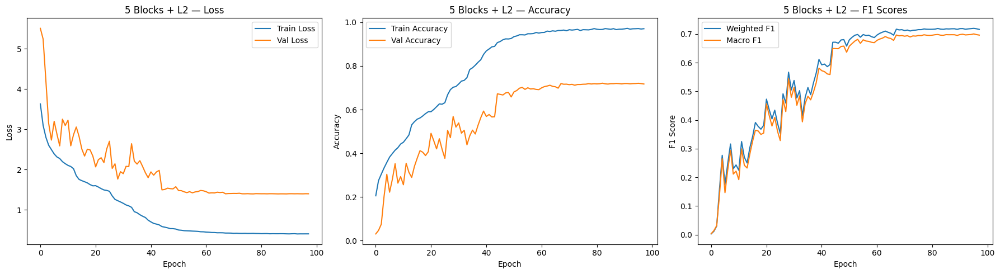

In [36]:
plot_training_history(history, "5 Blocks + L2");

In [37]:
y_true, y_pred, f1_weighted, f1_macro = evaluate_model(model_5block_L2, val_ds, class_names)


Validation Results:
  Weighted F1: 0.7180
  Macro F1:    0.6975

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.78      0.75      0.77       116
      Boris_Kustodiev       0.55      0.64      0.59        89
     Camille_Pissarro       0.64      0.65      0.65       124
        Childe_Hassam       0.62      0.62      0.62        77
         Claude_Monet       0.68      0.70      0.69       187
          Edgar_Degas       0.63      0.65      0.64        86
        Eugene_Boudin       0.80      0.68      0.74        78
         Gustave_Dore       0.91      0.92      0.92       106
           Ilya_Repin       0.47      0.53      0.49        76
      Ivan_Aivazovsky       0.87      0.91      0.89        81
        Ivan_Shishkin       0.82      0.75      0.79        73
  John_Singer_Sargent       0.75      0.73      0.74       110
         Marc_Chagall       0.62      0.62      0.62       107
      Martiros_Saryan       0.64 

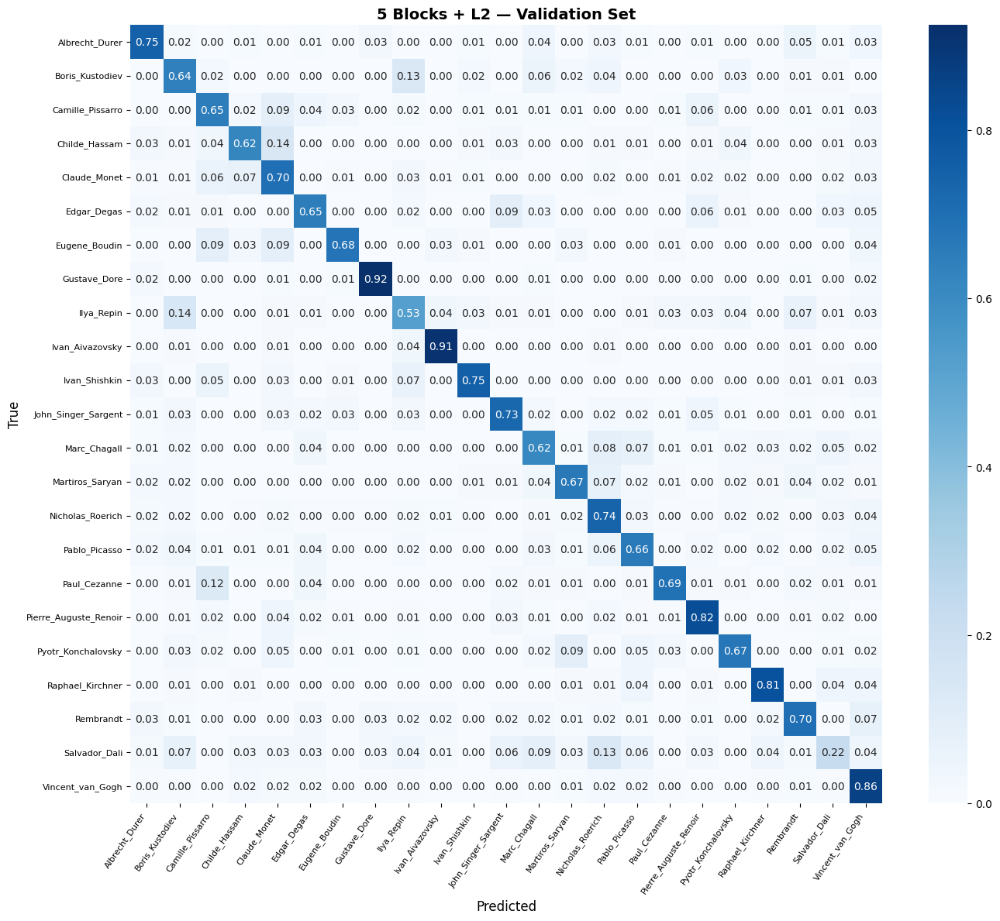

In [38]:
plot_confusion_matrix(y_true, y_pred, class_names, "5 Blocks + L2 — Validation Set");

In [39]:
wandb.log({"val_f1_weighted": f1_weighted, "val_f1_macro": f1_macro})
wandb.finish()

epoch/accuracy,▁▂▂▃▃▄▄▅▅▅▆▇▇▇▇█████████████████████████
epoch/epoch,▁▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
epoch/learning_rate,█████▄▄▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▇▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▃▄▄▄▅▅▅▆▅▅▅▆▆▆▆▆▇▇▆▇▇██████████████████
epoch/val_f1_macro,▁▄▂▃▃▃▃▄▄▅▄▆▄▆▅▅▅▆▆▇▇███████████████████
epoch/val_f1_weighted,▁▂▂▂▂▄▄▄▄▄▆▅▄▅▆▇█▇██████████████████████
epoch/val_loss,█▆▄▃▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_f1_weighted,▁
epoch/accuracy,0.97038


<a id="4" />

### 3.4 Model with 5 blocks and L2 regularizaion but higher dropout

In [39]:
wandb.init(
    project="wikiart-scratch",
    name="5block_L2_drop05",
    id=wandb.util.generate_id(),
    config={
        "architecture": "5-block CNN + higher dropout",
        "img_size": IMG_SIZE,
        "batch_size": BATCH_SIZE,
        "filters": [32, 64, 128, 256, 512],
        "dense_units": 256,
        "dropout": 0.5,
        "l2": 0.001,
        "augmentation": "none",
        "optimizer": "adam",
        "learning_rate": 0.001,
    }
)

In [40]:
model_5block_L2_drop05 = keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    layers.Rescaling(1./255),

    # Block 1: 128x128 -> 64x64
    layers.Conv2D(32, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 2: 64x64 -> 32x32
    layers.Conv2D(64, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 3: 32x32 -> 16x16
    layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 4: 16x16 -> 8x8
    layers.Conv2D(256, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 5: 8x8 -> 4x4
    layers.Conv2D(512, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Classifier (same as Test B, with dropout increased to 0.5)
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(NUM_CLASSES, activation='softmax'),
])

model_5block_L2_drop05.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

model_5block_L2_drop05.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_4 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_16 (Activation)      │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_17 (Activation)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_18 (Activation)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_19 (Activation)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 14, 14, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_20 (Activation)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │             

 Total params: 1,709,783 (6.52 MB)

 Trainable params: 1,707,799 (6.51 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [41]:
history = model_5block_L2_drop05.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    class_weight=class_weights,
    callbacks=[
        callbacks.EarlyStopping(
            monitor='val_loss',
            patience=20,
            restore_best_weights=True,
            verbose=1
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        ),
        F1Callback(val_ds),
        WandbMetricsLogger(),
    ],
)

Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.1474 - loss: 4.0264 — val_f1_weighted: 0.0018 — val_f1_macro: 0.0026
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - accuracy: 0.1477 - loss: 4.0243 - val_accuracy: 0.0303 - val_loss: 5.5507 - learning_rate: 0.0010 - val_f1_weighted: 0.0018 - val_f1_macro: 0.0026
Epoch 2/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - accuracy: 0.2320 - loss: 3.3415 — val_f1_weighted: 0.0080 — val_f1_macro: 0.0093
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 198ms/step - accuracy: 0.2321 - loss: 3.3401 - val_accuracy: 0.0341 - val_loss: 5.0104 - learning_rate: 0.0010 - val_f1_weighted: 0.0080 - val_f1_macro: 0.0093
Epoch 3/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.2575 - loss: 3.0617 — val_f1_weighted: 0.0137 — val_f1_macro: 0.0152
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 199ms/step - accuracy: 0.2575 - loss: 3.0604 - val_accuracy: 0.0401 - val_loss: 4.5755 - learning_rate: 0.0010 - val_f1_weighted: 0.0137 - val_f1_macro: 0.0152
Epoch 4

In [42]:
train_results = evaluate_model(model_5block_L2_drop05, train_ds, class_names, "Train")
val_results = evaluate_model(model_5block_L2_drop05, val_ds, class_names, "Validation")


Train Results:
  Weighted F1: 0.9665
  Macro F1:    0.9715

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.96      0.98      0.97       348
      Boris_Kustodiev       0.98      0.98      0.98       266
     Camille_Pissarro       0.91      0.96      0.94       373
        Childe_Hassam       0.93      1.00      0.96       231
         Claude_Monet       0.96      0.92      0.94       560
          Edgar_Degas       0.95      0.99      0.97       257
        Eugene_Boudin       0.99      1.00      0.99       233
         Gustave_Dore       1.00      1.00      1.00       317
           Ilya_Repin       0.97      0.99      0.98       227
      Ivan_Aivazovsky       0.99      1.00      0.99       242
        Ivan_Shishkin       0.98      1.00      0.99       218
  John_Singer_Sargent       0.96      0.99      0.98       329
         Marc_Chagall       0.97      1.00      0.99       322
      Martiros_Saryan       0.96      

#### 3.4.1 Evaluate model

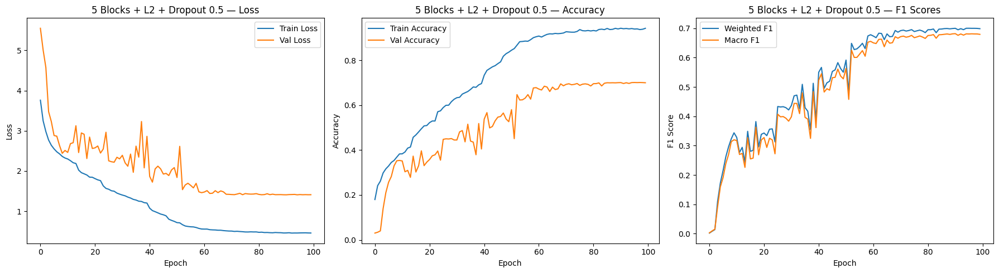

In [43]:
plot_training_history(history, "5 Blocks + L2 + Dropout 0.5");

In [44]:
y_true, y_pred, f1_weighted, f1_macro = evaluate_model(model_5block_L2_drop05, val_ds, class_names)


Validation Results:
  Weighted F1: 0.7001
  Macro F1:    0.6819

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.69      0.76      0.72       116
      Boris_Kustodiev       0.58      0.67      0.62        89
     Camille_Pissarro       0.65      0.62      0.63       124
        Childe_Hassam       0.57      0.60      0.58        77
         Claude_Monet       0.68      0.69      0.68       187
          Edgar_Degas       0.56      0.58      0.57        86
        Eugene_Boudin       0.72      0.74      0.73        78
         Gustave_Dore       0.95      0.92      0.94       106
           Ilya_Repin       0.56      0.55      0.56        76
      Ivan_Aivazovsky       0.92      0.90      0.91        81
        Ivan_Shishkin       0.80      0.75      0.77        73
  John_Singer_Sargent       0.69      0.71      0.70       110
         Marc_Chagall       0.64      0.57      0.60       107
      Martiros_Saryan       0.59 

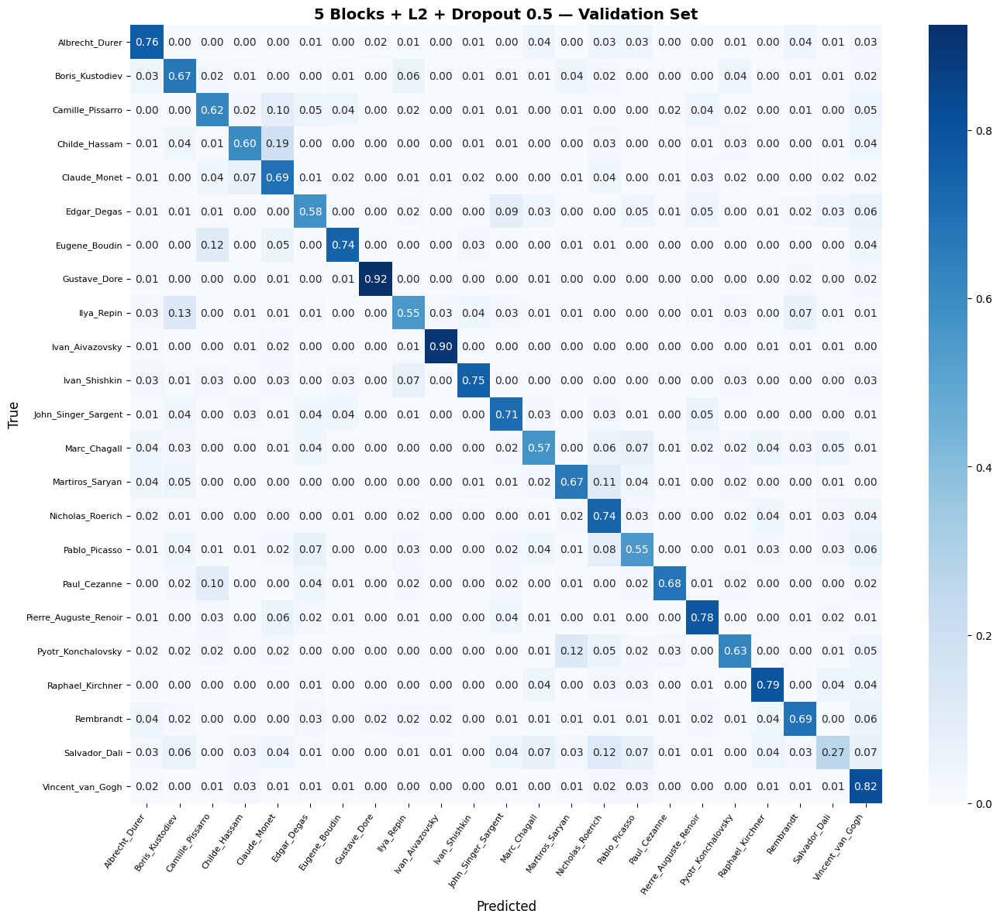

In [45]:
plot_confusion_matrix(y_true, y_pred, class_names, "5 Blocks + L2 + Dropout 0.5 — Validation Set");

In [46]:
wandb.log({"val_f1_weighted": f1_weighted, "val_f1_macro": f1_macro})
wandb.finish()

epoch/accuracy,▁▁▂▂▂▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇█████████████
epoch/epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇██
epoch/learning_rate,█████▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▃▂▂▃▃▄▄▅▄▃▆▆▅▆▆▄▇▇█▇██████████████████
epoch/val_f1_macro,▁▁▁▂▃▄▄▄▄▄▅▄▄▅▅▆▆▅▆▆▆▇▇▇████████████████
epoch/val_f1_weighted,▁▁▂▄▄▄▄▄▅▅▅▅▅▅▅▆▅▅▅▇▇▇▇▇▇███████████████
epoch/val_loss,█▇▃▃▃▃▃▄▄▄▃▂▃▃▄▂▂▂▂▂▂▂▂▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_f1_weighted,▁
epoch/accuracy,0.94251


<a id="5" />

### 3.5 Model with 5 blocks and L2 regularization but a deeper classifier

In [47]:
wandb.init(
    project="wikiart-scratch",
    name="5block-L2-deepclassifier",
    id=wandb.util.generate_id(),
    config={
        "architecture": "5-block CNN + deep classifier",
        "img_size": IMG_SIZE,
        "batch_size": BATCH_SIZE,
        "filters": [32, 64, 128, 256, 512],
        "dense_units": [512, 256],
        "dropout": 0.3,
        "l2": 0.001,
        "augmentation": "none",
        "optimizer": "adam",
        "learning_rate": 0.001,
    }
)

In [48]:
model_5blocks_L2_dc = keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    layers.Rescaling(1./255),

    # Block 1: 128x128 -> 64x64
    layers.Conv2D(32, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 2: 64x64 -> 32x32
    layers.Conv2D(64, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 3: 32x32 -> 16x16
    layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 4: 16x16 -> 8x8
    layers.Conv2D(256, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 5: 8x8 -> 4x4
    layers.Conv2D(512, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Deeper classifier (Test B had only Dense(256) -> Dropout -> Dense(23))
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.3),
    layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.3),
    layers.Dense(NUM_CLASSES, activation='softmax'),
])

model_5blocks_L2_dc.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

model_5blocks_L2_dc.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_5 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_21 (Activation)      │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_22          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_22 (Activation)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_23          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_23 (Activation)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_24 (Activation)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 14, 14, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_25 (Activation)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │             

 Total params: 1,972,439 (7.52 MB)

 Trainable params: 1,970,455 (7.52 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [49]:
history = model_5blocks_L2_dc.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    class_weight=class_weights,
    callbacks=[
        callbacks.EarlyStopping(
            monitor='val_loss',
            patience=20,
            restore_best_weights=True,
            verbose=1
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        ),
        F1Callback(val_ds),
        WandbMetricsLogger(),
    ],
)

Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.1233 - loss: 4.3941 — val_f1_weighted: 0.0018 — val_f1_macro: 0.0026
126/126 ━━━━━━━━━━━━━━━━━━━━ 42s 267ms/step - accuracy: 0.1236 - loss: 4.3915 - val_accuracy: 0.0303 - val_loss: 5.7890 - learning_rate: 0.0010 - val_f1_weighted: 0.0018 - val_f1_macro: 0.0026
Epoch 2/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - accuracy: 0.2190 - loss: 3.5178 — val_f1_weighted: 0.0018 — val_f1_macro: 0.0026
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 198ms/step - accuracy: 0.2193 - loss: 3.5156 - val_accuracy: 0.0303 - val_loss: 5.9319 - learning_rate: 0.0010 - val_f1_weighted: 0.0018 - val_f1_macro: 0.0026
Epoch 3/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.2539 - loss: 3.1426 — val_f1_weighted: 0.0584 — val_f1_macro: 0.0529
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 201ms/step - accuracy: 0.2541 - loss: 3.1412 - val_accuracy: 0.0831 - val_loss: 4.1082 - learning_rate: 0.0010 - val_f1_weighted: 0.0584 - val_f1_macro: 0.0529
Epoch 4

In [50]:
train_results = evaluate_model(model_5blocks_L2_dc, train_ds, class_names, "Train")
val_results = evaluate_model(model_5blocks_L2_dc, val_ds, class_names, "Validation")


Train Results:
  Weighted F1: 0.9696
  Macro F1:    0.9740

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.93      0.98      0.96       348
      Boris_Kustodiev       0.98      0.98      0.98       266
     Camille_Pissarro       0.95      0.95      0.95       373
        Childe_Hassam       0.98      1.00      0.99       231
         Claude_Monet       0.97      0.96      0.96       560
          Edgar_Degas       0.96      0.98      0.97       257
        Eugene_Boudin       0.97      1.00      0.99       233
         Gustave_Dore       0.99      0.99      0.99       317
           Ilya_Repin       0.98      0.97      0.98       227
      Ivan_Aivazovsky       1.00      1.00      1.00       242
        Ivan_Shishkin       0.98      1.00      0.99       218
  John_Singer_Sargent       0.98      0.99      0.98       329
         Marc_Chagall       0.96      1.00      0.98       322
      Martiros_Saryan       0.98      

#### 3.5.1 Evaluate model

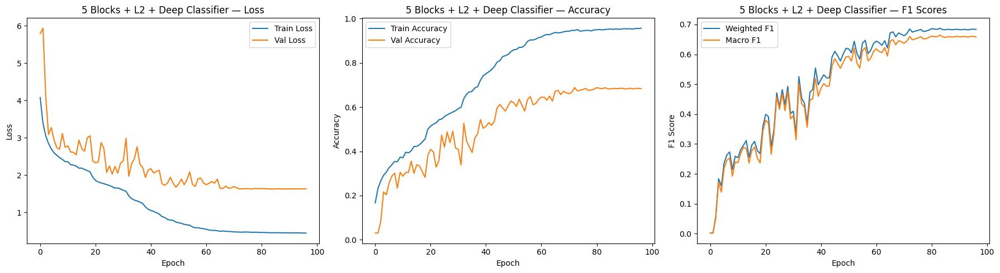

In [51]:
plot_training_history(history, "5 Blocks + L2 + Deep Classifier");

In [52]:
y_true, y_pred, f1w, f1m = evaluate_model(model_5blocks_L2_dc, val_ds, class_names)


Validation Results:
  Weighted F1: 0.6835
  Macro F1:    0.6593

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.58      0.76      0.66       116
      Boris_Kustodiev       0.58      0.58      0.58        89
     Camille_Pissarro       0.57      0.60      0.58       124
        Childe_Hassam       0.59      0.58      0.59        77
         Claude_Monet       0.68      0.61      0.64       187
          Edgar_Degas       0.52      0.53      0.53        86
        Eugene_Boudin       0.66      0.76      0.70        78
         Gustave_Dore       0.93      0.91      0.92       106
           Ilya_Repin       0.54      0.47      0.50        76
      Ivan_Aivazovsky       0.88      0.90      0.89        81
        Ivan_Shishkin       0.74      0.68      0.71        73
  John_Singer_Sargent       0.74      0.71      0.72       110
         Marc_Chagall       0.56      0.58      0.57       107
      Martiros_Saryan       0.66 

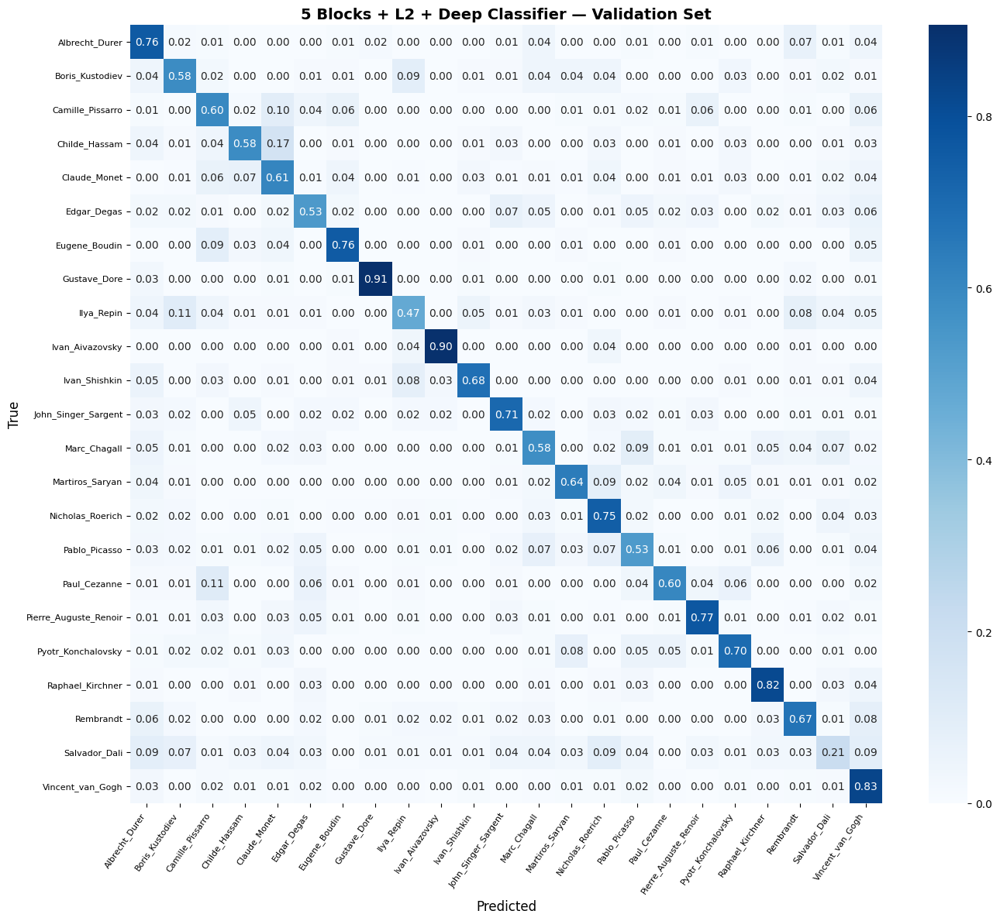

In [53]:
plot_confusion_matrix(y_true, y_pred, class_names, "5 Blocks + L2 + Deep Classifier — Validation Set");

In [54]:
wandb.log({"val_f1_weighted": f1_weighted, "val_f1_macro": f1_macro})
wandb.finish()

epoch/accuracy,▁▂▂▂▃▃▃▃▃▃▄▄▄▄▅▆▆▆▆▇▇▇▇▇▇███████████████
epoch/epoch,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▅▅▅▅▅▅▅▅▅▆▆▇▇▇▇█████
epoch/learning_rate,██████▄▄▄▄▄▄▄▃▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▇▇▆▆▆▅▅▅▄▄▄▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▁▃▄▄▄▄▄▄▅▄▆▅▆▅▆▇▇▇▇▇▇▇▇▇███████████████
epoch/val_f1_macro,▁▄▄▄▃▄▅▆▆▆▆▆▇▆▆▇▇▇▇█▇▇█▇▇█▇▇████████████
epoch/val_f1_weighted,▁▁▂▂▂▂▃▄▄▅▃▅▄▅▅▇▇▇▇▇▇▇▇▇▇▇██████████████
epoch/val_loss,█▃▃▃▃▂▂▂▂▂▂▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_f1_weighted,▁
epoch/accuracy,0.95651


<a id="6" />

### 3.6 Augmentation

Several different augmentation pipelines were ran, but we are only keeping the one that showed the best results.

In [16]:
wandb.init(
    project="wikiart-scratch",
    name="5block_aug",
    id=wandb.util.generate_id(),
    config={
        "architecture": "5-block CNN + aug",
        "img_size": IMG_SIZE,
        "batch_size": BATCH_SIZE,
        "filters": [32, 64, 128, 256, 512],
        "dense_units": 256,
        "dropout": 0.3,
        "l2": 0.001,
        "augmentation": "true",
        "optimizer": "adam",
        "learning_rate": 0.001,
    }
)

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [17]:
augmentation_layer = layers.Pipeline([
    layers.RandomContrast(factor=0.3, value_range=(0, 1)),
    layers.RandomSharpness(factor=0.5, value_range=(0, 1)),
])

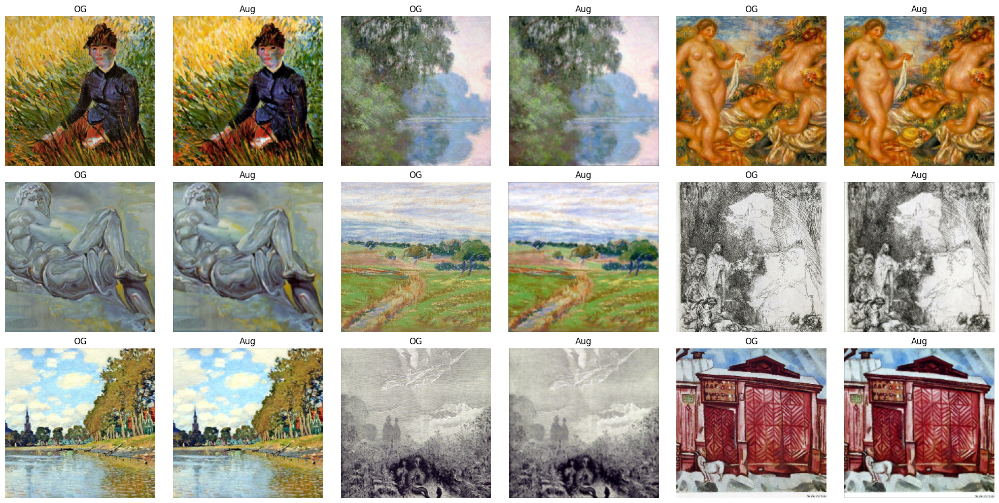

In [18]:
# Visualize the first 9 paintings in the dataset and their augmentation
plt.figure(figsize=(20,10))

for images, labels in train_ds.take(1):
  for i in range(9):

    # Left side plot: original paintings
    ax_left = plt.subplot(3, 6 ,i*2 + 1)
    plt.imshow(images[i].numpy().astype(np.uint8))
    plt.title(f"OG")
    plt.axis("off")

    paint_batch = tf.cast(images[i], tf.float32) / 255.0
    paint_batch = tf.expand_dims(paint_batch, axis=0)             # temporary tensor of the current image

     # Augment the selected 9 paintings
    aug_batch = augmentation_layer(paint_batch, training=True)  # augment the paintings in the temporary tensor
    aug_image = tf.clip_by_value(aug_batch[0], 0.0, 1.0).numpy()        # get the augmented painting from the temporary tensor

    # Right side plot: augmented painting
    ax_right = plt.subplot(3, 6, i*2 + 2)
    plt.imshow(aug_image)
    plt.title(f"Aug")
    plt.axis("off")

  plt.tight_layout()
  plt.show()

In [19]:
model_5blocks_aug = keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    layers.Rescaling(1./255),
    augmentation_layer,

    # Block 1: 128x128 -> 64x64
    layers.Conv2D(32, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 2: 64x64 -> 32x32
    layers.Conv2D(64, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 3: 32x32 -> 16x16
    layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 4: 16x16 -> 8x8
    layers.Conv2D(256, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Block 5: 8x8 -> 4x4
    layers.Conv2D(512, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Classifier
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.3),
    layers.Dense(NUM_CLASSES, activation='softmax'),
])

model_5blocks_aug.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

model_5blocks_aug.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pipeline_1 (Pipeline)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 14, 14, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,709,783 (6.52 MB)

 Trainable params: 1,707,799 (6.51 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [20]:
history = model_5blocks_aug.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    class_weight=class_weights,
    callbacks=[
        callbacks.EarlyStopping(
            monitor='val_loss',
            patience=20,
            restore_best_weights=True,
            verbose=1
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        ),
        F1Callback(val_ds),
        WandbMetricsLogger(),
    ],
)

Epoch 1/100


I0000 00:00:1777028883.213139     140 service.cc:152] XLA service 0x7aab7de729a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1777028883.213232     140 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1777028883.213241     140 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1777028899.700962     140 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.1631 - loss: 3.9479

2026-04-24 11:08:40.920576: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-24 11:08:41.062597: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - accuracy: 0.1634 - loss: 3.9457 — val_f1_weighted: 0.0018 — val_f1_macro: 0.0026
126/126 ━━━━━━━━━━━━━━━━━━━━ 60s 317ms/step - accuracy: 0.1637 - loss: 3.9435 - val_accuracy: 0.0303 - val_loss: 5.8738 - learning_rate: 0.0010 - val_f1_weighted: 0.0018 - val_f1_macro: 0.0026
Epoch 2/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.2515 - loss: 3.2383 — val_f1_weighted: 0.0062 — val_f1_macro: 0.0070
126/126 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.2517 - loss: 3.2368 - val_accuracy: 0.0330 - val_loss: 4.8335 - learning_rate: 0.0010 - val_f1_weighted: 0.0062 - val_f1_macro: 0.0070
Epoch 3/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.2812 - loss: 2.9451 — val_f1_weighted: 0.0665 — val_f1_macro: 0.0618
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 201ms/step - accuracy: 0.2814 - loss: 2.9437 - val_accuracy: 0.0955 - val_loss: 4.0159 - learning_rate: 0.0010 - val_f1_weighted: 0.0665 - val_f1_macro: 0.0618
Epoch 4/100
125/126

In [21]:
train_results = evaluate_model(model_5blocks_aug, train_ds, class_names, "Train")
val_results = evaluate_model(model_5blocks_aug, val_ds, class_names, "Validation")


Train Results:
  Weighted F1: 0.9434
  Macro F1:    0.9491

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.93      0.97      0.95       348
      Boris_Kustodiev       0.91      0.96      0.93       266
     Camille_Pissarro       0.88      0.93      0.91       373
        Childe_Hassam       0.89      0.98      0.93       231
         Claude_Monet       0.93      0.90      0.91       560
          Edgar_Degas       0.96      0.98      0.97       257
        Eugene_Boudin       0.94      0.99      0.96       233
         Gustave_Dore       0.99      1.00      0.99       317
           Ilya_Repin       0.88      0.97      0.92       227
      Ivan_Aivazovsky       0.99      1.00      0.99       242
        Ivan_Shishkin       0.90      0.99      0.95       218
  John_Singer_Sargent       0.98      0.99      0.98       329
         Marc_Chagall       0.98      0.98      0.98       322
      Martiros_Saryan       0.86      

#### 3.6.1 Evaluate model

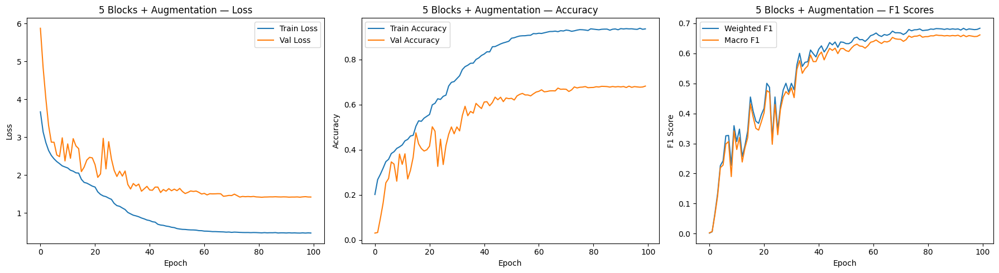

In [22]:
plot_training_history(history, "5 Blocks + Augmentation");

In [23]:
y_true, y_pred, f1_weighted, f1_macro = evaluate_model(model_5blocks_aug, val_ds, class_names)


Validation Results:
  Weighted F1: 0.6808
  Macro F1:    0.6583

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.68      0.77      0.72       116
      Boris_Kustodiev       0.52      0.55      0.53        89
     Camille_Pissarro       0.55      0.63      0.59       124
        Childe_Hassam       0.63      0.57      0.60        77
         Claude_Monet       0.67      0.66      0.66       187
          Edgar_Degas       0.64      0.53      0.58        86
        Eugene_Boudin       0.68      0.73      0.70        78
         Gustave_Dore       0.93      0.93      0.93       106
           Ilya_Repin       0.46      0.55      0.50        76
      Ivan_Aivazovsky       0.85      0.89      0.87        81
        Ivan_Shishkin       0.72      0.75      0.74        73
  John_Singer_Sargent       0.72      0.65      0.68       110
         Marc_Chagall       0.64      0.59      0.61       107
      Martiros_Saryan       0.52 

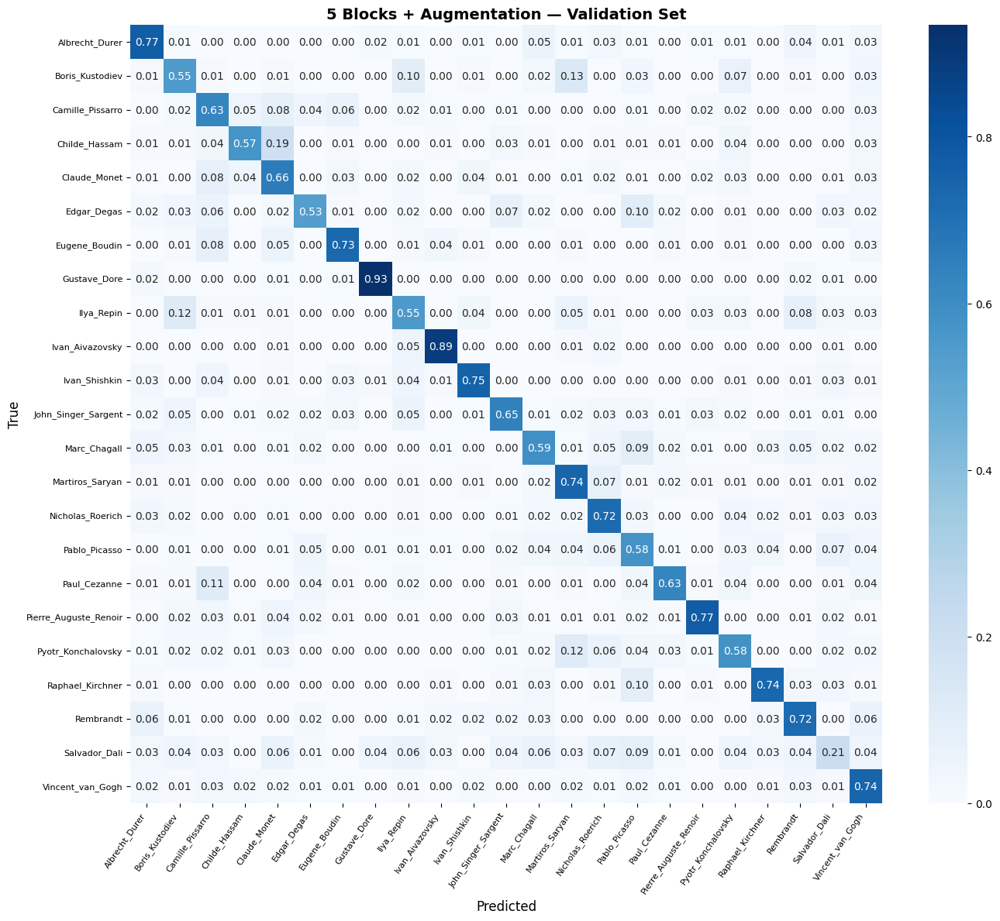

In [29]:
plot_confusion_matrix(y_true, y_pred, class_names, "5 Blocks + Augmentation — Validation Set");

In [30]:
wandb.log({"val_f1_weighted": f1_weighted, "val_f1_macro": f1_macro})
wandb.finish()

epoch/accuracy,▁▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇███
epoch/learning_rate,██████████▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▁▁▁▁
epoch/loss,█▇▆▅▅▅▅▄▄▄▄▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁
epoch/val_accuracy,▁▁▂▄▄▅▄▅▅▅▅▆▆▅▇▆▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇█
epoch/val_f1_macro,▁▁▁▄▄▅▄▅▄▅▄▆▆▅▆▅▄▅▆▆▇▇▇▇▆▇▇▇▇▇▇█
epoch/val_f1_weighted,▁▁▁▄▄▅▄▅▄▅▄▆▆▅▆▅▅▆▆▆▇▇▇▇▆▇▇▇▇▇▇█
epoch/val_loss,▇█▅▃▃▂▃▂▃▂▃▂▂▂▂▂▃▂▂▂▁▁▁▁▂▂▂▂▂▁▁▁
val_f1_macro,▁
val_f1_weighted,▁
epoch/accuracy,0.77856


<a id="7" />

### 3.7 Optuna

In [65]:
# !pip install optuna -q
# !pip install optuna optuna-integration[tfkeras] -q

In [66]:
# import optuna
# from optuna.integration import TFKerasPruningCallback
# optuna.logging.set_verbosity(optuna.logging.WARNING)

In [67]:
# # ROUND 1 — Architecture (number of layers, filters, dense, dropout, augmentation)

# def objective_round1(trial):
#     # Search space
#     n_blocks    = trial.suggest_int('n_blocks', 2, 4)          # 2, 3 or 4 blocks
#     filters     = [
#         trial.suggest_categorical(f'filters_{i}', [32, 64, 128, 256])
#         for i in range(n_blocks)
#     ]
#     dense_units = trial.suggest_categorical('dense_units', [128, 256, 512])
#     dropout     = trial.suggest_float('dropout', 0.2, 0.5)
#     lr          = trial.suggest_float('lr', 1e-4, 1e-2, log=True)
#     use_aug     = trial.suggest_categorical('use_aug', [True, False])

#     # Augmentation
#     aug_layer = keras.Sequential([
#         layers.RandomFlip("horizontal"),
#         layers.RandomRotation(0.1),
#         layers.RandomZoom(0.1),
#     ]) if use_aug else None

#     # Model
#     model = keras.Sequential([layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)), layers.Rescaling(1./255)])
#     if aug_layer:
#         model.add(aug_layer)

#     for n_filters in filters:
#         model.add(layers.Conv2D(n_filters, (3, 3), padding='same'))
#         model.add(layers.BatchNormalization())
#         model.add(layers.Activation('relu'))
#         model.add(layers.MaxPooling2D((2, 2)))

#     model.add(layers.GlobalAveragePooling2D())
#     model.add(layers.Dense(dense_units, activation='relu'))
#     model.add(layers.Dropout(dropout))
#     model.add(layers.Dense(NUM_CLASSES, activation='softmax'))

#     model.compile(
#         optimizer=keras.optimizers.Adam(lr),
#         loss='sparse_categorical_crossentropy',
#         metrics=['accuracy'],
#     )

#     # W&B logging
#     wandb.init(
#         project="wikiart-scratch",
#         name=f"r1-trial-{trial.number}",
#         config=trial.params,
#         reinit=True)

#     history = model.fit(
#         train_ds, validation_data=val_ds,
#         epochs=30,
#         class_weight=class_weights,
#         callbacks=[
#             callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
#             callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6),
#             F1Callback(val_ds),
#             WandbMetricsLogger(),
#             TFKerasPruningCallback(trial, 'val_accuracy'),],
#         verbose=0,)

#     val_f1 = max(history.history.get('val_f1_weighted', [0]))
#     wandb.log({"val_f1_weighted": val_f1})
#     wandb.finish()
#     return val_f1

# study_r1 = optuna.create_study(
#     direction='maximize',
#     pruner=optuna.pruners.MedianPruner(n_warmup_steps=5),
#     sampler=optuna.samplers.TPESampler(seed=SEED),)
# study_r1.optimize(objective_round1, n_trials=20)

# print(f"  Val F1: {study_r1.best_trial.value:.4f}")
# print(f"  Params: {study_r1.best_trial.params}")

# best_arch = study_r1.best_trial.params

In [11]:
best_arch = {'n_blocks': 3, 'filters_0': 64, 'filters_1': 64, 'filters_2': 128, 'dense_units': 256, 'dropout': 0.3621621220356741, 'lr': 0.0006970162729730899, 'use_aug': False}

In [69]:
# # ROUND 2 — Training (optimizer, loss, learning_rate_factor, gamma, alpha)
# # The architecture used is the one found to be the best in round 1

# def objective_round2(trial):
#     # Search space
#     optimizer_name = trial.suggest_categorical('optimizer', ['adam', 'rmsprop', 'sgd'])
#     loss_name      = trial.suggest_categorical('loss', ['sparse_categorical_crossentropy', 'focal'])
#     lr             = trial.suggest_float('lr', 1e-4, 1e-2, log=True)
#     lr_factor      = trial.suggest_float('lr_factor', 0.2, 0.8)

#     # Gamma and alpha only exist if loss is focal
#     if loss_name == 'focal':
#         gamma     = trial.suggest_float('gamma', 0.5, 5.0)
#         use_alpha = trial.suggest_categorical('use_alpha', [True, False])
#     else:
#         gamma     = None
#         use_alpha = False

#     # Loss
#     if loss_name == 'focal':
#         alpha   = list(class_weights.values()) if use_alpha else None
#         loss_fn = sparse_focal_loss(gamma=gamma, alpha=alpha)
#         fit_class_weights = None      # focal loss deals with weihts internally
#     else:
#         loss_fn           = 'sparse_categorical_crossentropy'
#         fit_class_weights = class_weights

#     n_blocks  = best_arch['n_blocks']
#     filters   = [best_arch[f'filters_{i}'] for i in range(n_blocks)]

#     aug_layer = keras.Sequential([
#         layers.RandomFlip("horizontal"),
#         layers.RandomRotation(0.1),
#         layers.RandomZoom(0.1),
#     ]) if best_arch['use_aug'] else None

#     model = keras.Sequential([layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)), layers.Rescaling(1./255)])
#     if aug_layer:
#         model.add(aug_layer)

#     for n_filters in filters:
#         model.add(layers.Conv2D(n_filters, (3, 3), padding='same'))
#         model.add(layers.BatchNormalization())
#         model.add(layers.Activation('relu'))
#         model.add(layers.MaxPooling2D((2, 2)))

#     model.add(layers.GlobalAveragePooling2D())
#     model.add(layers.Dense(best_arch['dense_units'], activation='relu'))
#     model.add(layers.Dropout(best_arch['dropout']))
#     model.add(layers.Dense(NUM_CLASSES, activation='softmax'))

#     # Optimizer
#     if optimizer_name == 'adam':
#         opt = keras.optimizers.Adam(lr)
#     elif optimizer_name == 'rmsprop':
#         opt = keras.optimizers.RMSprop(lr)
#     else:
#         opt = keras.optimizers.SGD(lr, momentum=0.9)

#     model.compile(optimizer=opt, loss=loss_fn, metrics=['accuracy'])

#     # W&B logging
#     wandb.init(
#         project="wikiart-scratch",
#         name=f"r2-trial-{trial.number}",
#         config={**best_arch, **trial.params},
#         reinit=True)

#     history = model.fit(
#         train_ds, validation_data=val_ds,
#         epochs=30,
#         class_weight=fit_class_weights,
#         callbacks=[
#             callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
#             callbacks.ReduceLROnPlateau(monitor='val_loss', factor=lr_factor, patience=3, min_lr=1e-6),
#             F1Callback(val_ds),
#             WandbMetricsLogger(),
#             TFKerasPruningCallback(trial, 'val_accuracy'),],
#         verbose=0,)

#     val_f1 = max(history.history.get('val_f1_weighted', [0]))
#     wandb.log({"val_f1_weighted": val_f1})
#     wandb.finish()
#     return val_f1

# study_r2 = optuna.create_study(
#     direction='maximize',
#     pruner=optuna.pruners.MedianPruner(n_warmup_steps=5),
#     sampler=optuna.samplers.TPESampler(seed=SEED),)
# study_r2.optimize(objective_round2, n_trials=20)

# print(f"  Val F1: {study_r2.best_trial.value:.4f}")
# print(f"  Params: {study_r2.best_trial.params}")

# best_train = study_r2.best_trial.params

In [12]:
best_train = {'optimizer': 'rmsprop', 'loss': 'focal', 'lr': 0.0022052283640987573, 'lr_factor': 0.22232240832904548, 'gamma': 2.1824342056643196, 'use_alpha': False}

Epoch 1/100


I0000 00:00:1777006666.462233     139 service.cc:152] XLA service 0x7bfb1400e210 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1777006666.462273     139 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1777006666.462278     139 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1777006667.134502     139 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-04-24 04:57:53.392856: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-24 04:57:53.564123: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
I0000 00:00:1777006681.049047     139 device_co

125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - accuracy: 0.1810 - loss: 2.4730

2026-04-24 04:58:28.727849: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-24 04:58:28.875010: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - accuracy: 0.1812 - loss: 2.4715 — val_f1_weighted: 0.0018 — val_f1_macro: 0.0026
126/126 ━━━━━━━━━━━━━━━━━━━━ 63s 372ms/step - accuracy: 0.1815 - loss: 2.4701 - val_accuracy: 0.0303 - val_loss: 3.3432 - learning_rate: 0.0022 - val_f1_weighted: 0.0018 - val_f1_macro: 0.0026
Epoch 2/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - accuracy: 0.2676 - loss: 2.0276 — val_f1_weighted: 0.0341 — val_f1_macro: 0.0204
126/126 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - accuracy: 0.2679 - loss: 2.0268 - val_accuracy: 0.0562 - val_loss: 4.1577 - learning_rate: 0.0022 - val_f1_weighted: 0.0341 - val_f1_macro: 0.0204
Epoch 3/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.3163 - loss: 1.8617 — val_f1_weighted: 0.1083 — val_f1_macro: 0.0872
126/126 ━━━━━━━━━━━━━━━━━━━━ 29s 233ms/step - accuracy: 0.3164 - loss: 1.8611 - val_accuracy: 0.1498 - val_loss: 2.7495 - learning_rate: 0.0022 - val_f1_weighted: 0.1083 - val_f1_macro: 0.0872
Epoch 4/100
125/126

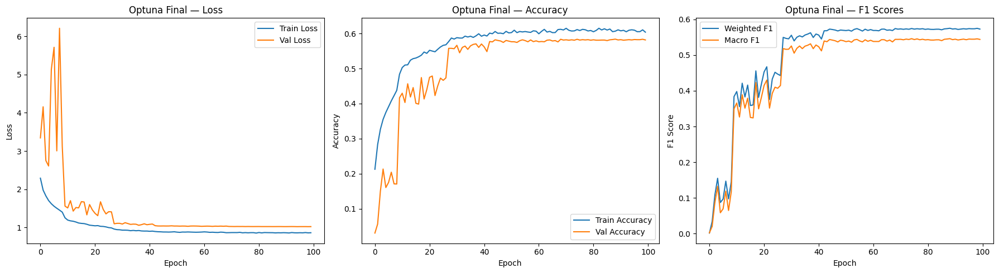


Validation Results:
  Weighted F1: 0.5748
  Macro F1:    0.5454

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.65      0.66      0.66       116
      Boris_Kustodiev       0.46      0.46      0.46        89
     Camille_Pissarro       0.51      0.48      0.50       124
        Childe_Hassam       0.56      0.39      0.46        77
         Claude_Monet       0.53      0.63      0.58       187
          Edgar_Degas       0.36      0.27      0.31        86
        Eugene_Boudin       0.70      0.65      0.68        78
         Gustave_Dore       0.89      0.89      0.89       106
           Ilya_Repin       0.35      0.30      0.32        76
      Ivan_Aivazovsky       0.75      0.79      0.77        81
        Ivan_Shishkin       0.73      0.59      0.65        73
  John_Singer_Sargent       0.49      0.54      0.51       110
         Marc_Chagall       0.48      0.44      0.46       107
      Martiros_Saryan       0.53 

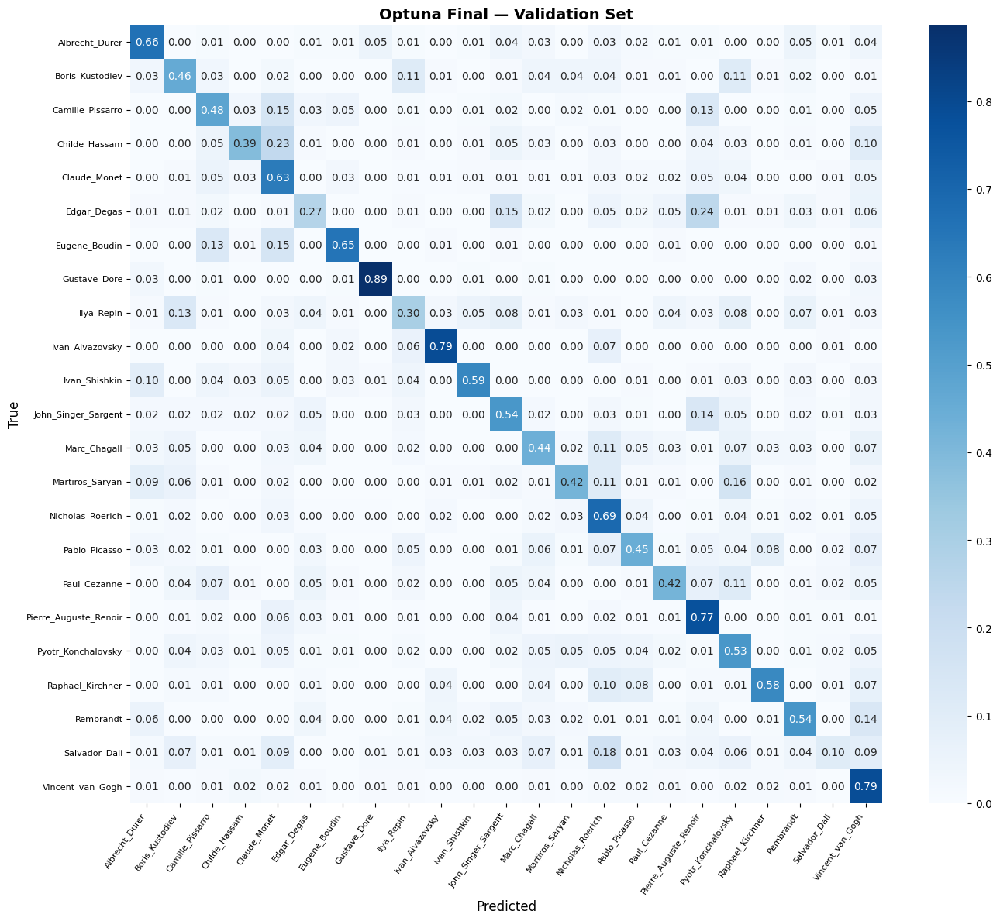

epoch/accuracy,▁▂▃▃▄▆▆▆▆▆▆▆▇▇▇▇▇███████████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,█████▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▇▆▅▅▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▁▃▃▃▆▆▆▆▆▇█████████████████████████████
epoch/val_f1_macro,▁▂▂▂▂▅▆▅▆▅▅▆▅▆█▇████████████████████████
epoch/val_f1_weighted,▁▂▂▂▅▆▅▅▆▆██████████████████████████████
epoch/val_loss,▆▄▃▇█▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_f1_weighted,▁
epoch/accuracy,0.60385


In [19]:
# Creating the final model

n_blocks = best_arch['n_blocks']
filters  = [best_arch[f'filters_{i}'] for i in range(n_blocks)]

aug_layer = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
]) if best_arch['use_aug'] else None

model_optuna = keras.Sequential([layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)), layers.Rescaling(1./255)])
if aug_layer:
    model_optuna.add(aug_layer)

for n_filters in filters:
    model_optuna.add(layers.Conv2D(n_filters, (3, 3), padding='same'))
    model_optuna.add(layers.BatchNormalization())
    model_optuna.add(layers.Activation('relu'))
    model_optuna.add(layers.MaxPooling2D((2, 2)))

model_optuna.add(layers.GlobalAveragePooling2D())
model_optuna.add(layers.Dense(best_arch['dense_units'], activation='relu'))
model_optuna.add(layers.Dropout(best_arch['dropout']))
model_optuna.add(layers.Dense(NUM_CLASSES, activation='softmax'))

# Optimizer
if best_train['optimizer'] == 'adam':
    opt = keras.optimizers.Adam(best_train['lr'])
elif best_train['optimizer'] == 'rmsprop':
    opt = keras.optimizers.RMSprop(best_train['lr'])
else:
    opt = keras.optimizers.SGD(best_train['lr'], momentum=0.9)

# Loss
if best_train['loss'] == 'focal':
    use_alpha = best_train.get('use_alpha', False)
    gamma     = best_train.get('gamma', 2.0)
    alpha     = list(class_weights.values()) if use_alpha else None
    loss_fn   = sparse_focal_loss(gamma=gamma, alpha=alpha)
    fit_class_weights = None
else:
    loss_fn           = 'sparse_categorical_crossentropy'
    fit_class_weights = class_weights

model_optuna.compile(optimizer=opt, loss=loss_fn, metrics=['accuracy'])

# W&B
wandb.init(
    project="wikiart-scratch",
    name="optuna",
    config={**best_arch, **best_train},
)

final_history = model_optuna.fit(
    train_ds, validation_data=val_ds,
    epochs=100,
    class_weight=fit_class_weights,
    callbacks=[
        callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=best_train['lr_factor'], patience=5, min_lr=1e-6),
        F1Callback(val_ds),
        WandbMetricsLogger(),],)

plot_training_history(final_history, "Optuna Final")
y_true, y_pred, f1_weighted, f1_macro = evaluate_model(model_optuna, val_ds, class_names)
plot_confusion_matrix(y_true, y_pred, class_names, "Optuna Final — Validation Set")

wandb.log({"val_f1_weighted": f1_weighted, "val_f1_macro": f1_macro})
wandb.finish()

In [20]:
train_results = evaluate_model(model_optuna, train_ds, class_names, "Train")
val_results = evaluate_model(model_optuna, val_ds, class_names, "Validation")


Train Results:
  Weighted F1: 0.6467
  Macro F1:    0.6257

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.68      0.70      0.69       348
      Boris_Kustodiev       0.65      0.52      0.57       266
     Camille_Pissarro       0.52      0.54      0.53       373
        Childe_Hassam       0.54      0.41      0.47       231
         Claude_Monet       0.63      0.72      0.67       560
          Edgar_Degas       0.47      0.36      0.41       257
        Eugene_Boudin       0.69      0.72      0.71       233
         Gustave_Dore       0.90      0.92      0.91       317
           Ilya_Repin       0.57      0.56      0.57       227
      Ivan_Aivazovsky       0.80      0.83      0.81       242
        Ivan_Shishkin       0.71      0.70      0.71       218
  John_Singer_Sargent       0.59      0.62      0.60       329
         Marc_Chagall       0.60      0.53      0.56       322
      Martiros_Saryan       0.65      

<a id="8" />

#### 3.7.1 Optuna + L2

Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.1729 - loss: 2.7766 — val_f1_weighted: 0.0018 — val_f1_macro: 0.0026
126/126 ━━━━━━━━━━━━━━━━━━━━ 41s 286ms/step - accuracy: 0.1732 - loss: 2.7750 - val_accuracy: 0.0303 - val_loss: 3.6241 - learning_rate: 0.0022 - val_f1_weighted: 0.0018 - val_f1_macro: 0.0026
Epoch 2/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.2636 - loss: 2.2703 — val_f1_weighted: 0.0092 — val_f1_macro: 0.0071
126/126 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - accuracy: 0.2639 - loss: 2.2691 - val_accuracy: 0.0345 - val_loss: 3.8514 - learning_rate: 0.0022 - val_f1_weighted: 0.0092 - val_f1_macro: 0.0071
Epoch 3/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.3052 - loss: 2.0866 — val_f1_weighted: 0.0540 — val_f1_macro: 0.0421
126/126 ━━━━━━━━━━━━━━━━━━━━ 29s 232ms/step - accuracy: 0.3053 - loss: 2.0859 - val_accuracy: 0.0734 - val_loss: 3.5782 - learning_rate: 0.0022 - val_f1_weighted: 0.0540 - val_f1_macro: 0.0421
Epoch 4

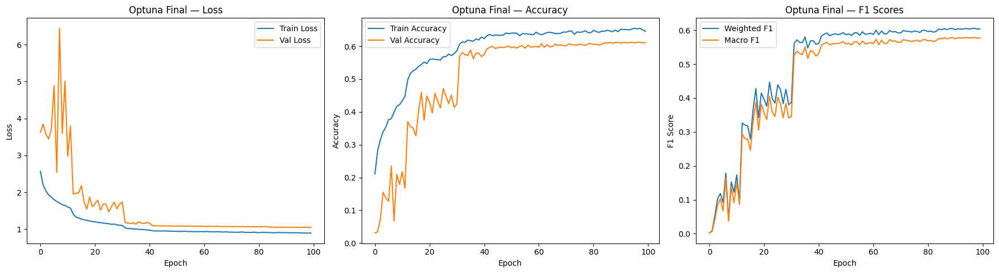


Validation Results:
  Weighted F1: 0.6056
  Macro F1:    0.5786

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.59      0.67      0.63       116
      Boris_Kustodiev       0.48      0.53      0.51        89
     Camille_Pissarro       0.52      0.50      0.51       124
        Childe_Hassam       0.63      0.52      0.57        77
         Claude_Monet       0.55      0.64      0.59       187
          Edgar_Degas       0.37      0.33      0.35        86
        Eugene_Boudin       0.72      0.65      0.68        78
         Gustave_Dore       0.88      0.89      0.88       106
           Ilya_Repin       0.49      0.43      0.46        76
      Ivan_Aivazovsky       0.78      0.80      0.79        81
        Ivan_Shishkin       0.72      0.59      0.65        73
  John_Singer_Sargent       0.54      0.60      0.57       110
         Marc_Chagall       0.49      0.46      0.47       107
      Martiros_Saryan       0.58 

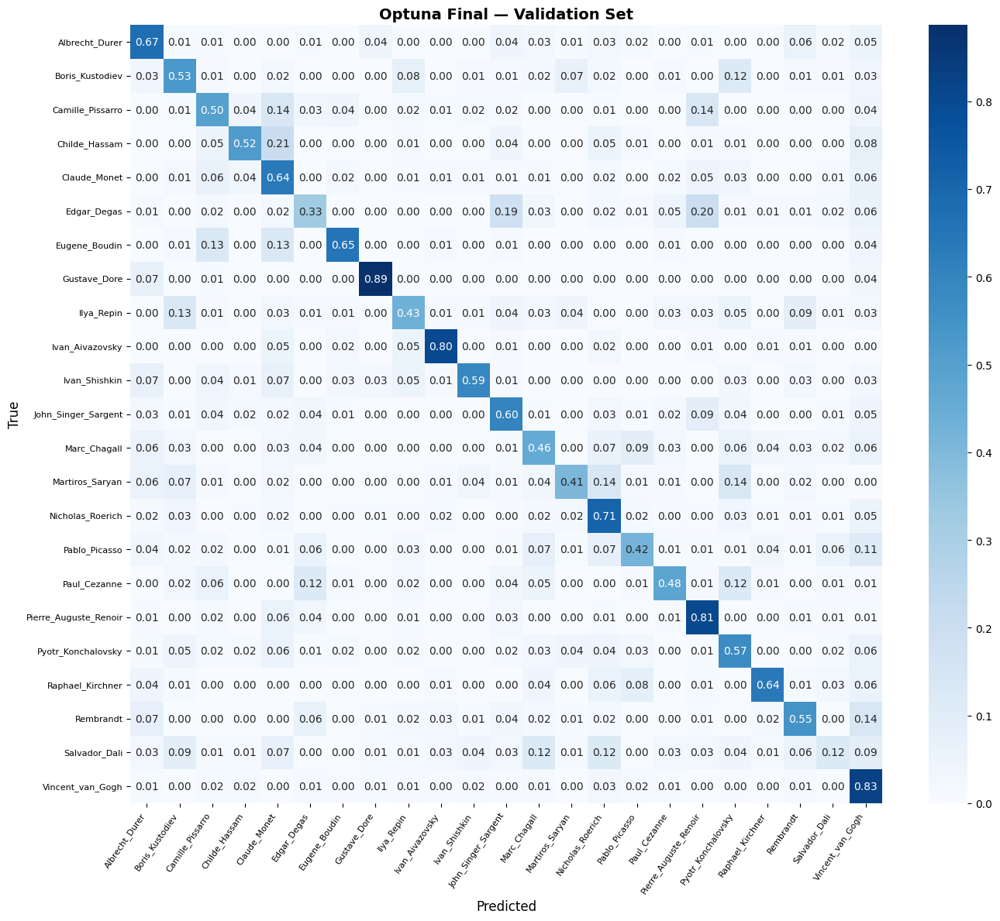

epoch/accuracy,▁▂▂▄▄▅▆▆▆▆▆▆▇▆▇▇▇███████████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█████
epoch/learning_rate,█████▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▆▆▅▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▃▃▅▅▅▆▆▆██████████████████████████████
epoch/val_f1_macro,▁▁▃▁▂▆▅▆▅▆▇▇██▇█████████████████████████
epoch/val_f1_weighted,▁▂▂▂▂▂▂▅▅▆▆▅▆██▇▇███████████████████████
epoch/val_loss,▅▄█▄▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_f1_weighted,▁
epoch/accuracy,0.64596


In [21]:
model_optuna_L2 = keras.Sequential([layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)), layers.Rescaling(1./255)])
if aug_layer:
    model_optuna_L2.add(aug_layer)

for n_filters in filters:
    model_optuna_L2.add(layers.Conv2D(n_filters, (3, 3), padding='same', kernel_regularizer=regularizers.l2(0.001)))
    model_optuna_L2.add(layers.BatchNormalization())
    model_optuna_L2.add(layers.Activation('relu'))
    model_optuna_L2.add(layers.MaxPooling2D((2, 2)))

model_optuna_L2.add(layers.GlobalAveragePooling2D())
model_optuna_L2.add(layers.Dense(best_arch['dense_units'], activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model_optuna_L2.add(layers.Dropout(best_arch['dropout']))
model_optuna_L2.add(layers.Dense(NUM_CLASSES, activation='softmax'))

# Optimizer
if best_train['optimizer'] == 'adam':
    opt = keras.optimizers.Adam(best_train['lr'])
elif best_train['optimizer'] == 'rmsprop':
    opt = keras.optimizers.RMSprop(best_train['lr'])
else:
    opt = keras.optimizers.SGD(best_train['lr'], momentum=0.9)

# Loss
if best_train['loss'] == 'focal':
    use_alpha = best_train.get('use_alpha', False)
    gamma     = best_train.get('gamma', 2.0)
    alpha     = list(class_weights.values()) if use_alpha else None
    loss_fn   = sparse_focal_loss(gamma=gamma, alpha=alpha)
    fit_class_weights = None
else:
    loss_fn           = 'sparse_categorical_crossentropy'
    fit_class_weights = class_weights

model_optuna_L2.compile(optimizer=opt, loss=loss_fn, metrics=['accuracy'])

# W&B
wandb.init(
    project="wikiart-scratch",
    name="optuna_L2",
    config={**best_arch, **best_train, "l2": 0.001,},
)

final_history = model_optuna_L2.fit(
    train_ds, validation_data=val_ds,
    epochs=100,
    class_weight=fit_class_weights,
    callbacks=[
        callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=best_train['lr_factor'], patience=5, min_lr=1e-6),
        F1Callback(val_ds),
        WandbMetricsLogger(),
    ],
)

plot_training_history(final_history, "Optuna Final")
y_true, y_pred, f1_weighted, f1_macro = evaluate_model(model_optuna_L2, val_ds, class_names)
plot_confusion_matrix(y_true, y_pred, class_names, "Optuna Final — Validation Set")

wandb.log({"val_f1_weighted": f1_weighted, "val_f1_macro": f1_macro})
wandb.finish()

In [22]:
train_results = evaluate_model(model_optuna_L2, train_ds, class_names, "Train")
val_results = evaluate_model(model_optuna_L2, val_ds, class_names, "Validation")


Train Results:
  Weighted F1: 0.6832
  Macro F1:    0.6628

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.70      0.70      0.70       348
      Boris_Kustodiev       0.62      0.56      0.59       266
     Camille_Pissarro       0.57      0.57      0.57       373
        Childe_Hassam       0.61      0.47      0.53       231
         Claude_Monet       0.66      0.76      0.71       560
          Edgar_Degas       0.50      0.46      0.48       257
        Eugene_Boudin       0.75      0.77      0.76       233
         Gustave_Dore       0.91      0.93      0.92       317
           Ilya_Repin       0.58      0.60      0.59       227
      Ivan_Aivazovsky       0.81      0.84      0.83       242
        Ivan_Shishkin       0.69      0.75      0.72       218
  John_Singer_Sargent       0.65      0.67      0.66       329
         Marc_Chagall       0.65      0.63      0.64       322
      Martiros_Saryan       0.67      

<a id="9" />

#### 3.7.2 Optuna + augmentation

In [13]:
best_arch['use_aug'] = True

Epoch 1/100


I0000 00:00:1777024563.567071     138 cuda_dnn.cc:529] Loaded cuDNN version 91002


126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.1716 - loss: 2.4991 — val_f1_weighted: 0.0196 — val_f1_macro: 0.0148
126/126 ━━━━━━━━━━━━━━━━━━━━ 72s 500ms/step - accuracy: 0.1719 - loss: 2.4976 - val_accuracy: 0.0787 - val_loss: 2.9532 - learning_rate: 0.0022 - val_f1_weighted: 0.0196 - val_f1_macro: 0.0148
Epoch 2/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step - accuracy: 0.2621 - loss: 2.0533 — val_f1_weighted: 0.0896 — val_f1_macro: 0.0730
126/126 ━━━━━━━━━━━━━━━━━━━━ 54s 427ms/step - accuracy: 0.2623 - loss: 2.0525 - val_accuracy: 0.1397 - val_loss: 2.7196 - learning_rate: 0.0022 - val_f1_weighted: 0.0896 - val_f1_macro: 0.0730
Epoch 3/100
125/126 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step - accuracy: 0.2927 - loss: 1.9082 — val_f1_weighted: 0.1400 — val_f1_macro: 0.1148
126/126 ━━━━━━━━━━━━━━━━━━━━ 54s 430ms/step - accuracy: 0.2928 - loss: 1.9076 - val_accuracy: 0.1858 - val_loss: 2.5256 - learning_rate: 0.0022 - val_f1_weighted: 0.1400 - val_f1_macro: 0.1148
Epoch 4/100
125/126

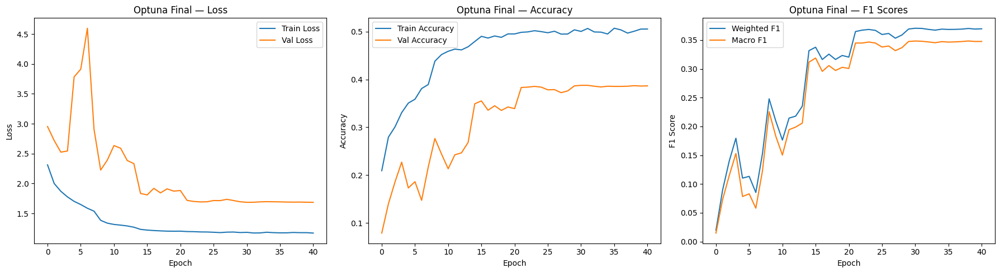


Validation Results:
  Weighted F1: 0.3704
  Macro F1:    0.3483

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.44      0.51      0.47       116
      Boris_Kustodiev       0.35      0.31      0.33        89
     Camille_Pissarro       0.28      0.41      0.34       124
        Childe_Hassam       0.31      0.36      0.34        77
         Claude_Monet       0.36      0.36      0.36       187
          Edgar_Degas       0.30      0.03      0.06        86
        Eugene_Boudin       0.62      0.45      0.52        78
         Gustave_Dore       0.73      0.49      0.59       106
           Ilya_Repin       0.41      0.16      0.23        76
      Ivan_Aivazovsky       0.88      0.52      0.65        81
        Ivan_Shishkin       0.21      0.32      0.25        73
  John_Singer_Sargent       0.74      0.29      0.42       110
         Marc_Chagall       0.18      0.15      0.16       107
      Martiros_Saryan       0.32 

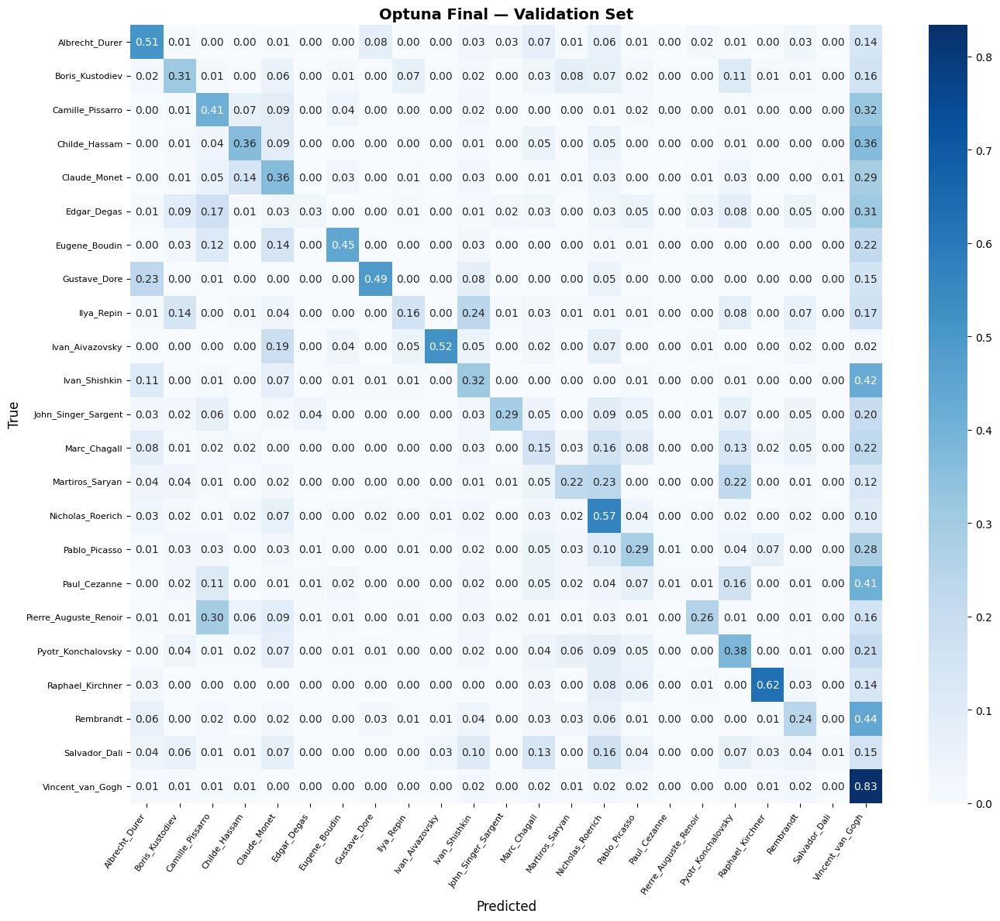

epoch/accuracy,▁▃▃▄▄▅▅▅▆▇▇▇▇▇▇█████████████████████████
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
epoch/learning_rate,███████▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▆▅▅▄▄▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▃▄▃▃▃▄▅▅▄▅▅▅▇▇▇▇▇▇▇███████████████████
epoch/val_f1_macro,▁▂▃▄▂▂▂▃▅▅▄▅▅▅▇▇▇▇▇▇▇███████████████████
epoch/val_f1_weighted,▁▂▃▄▃▃▂▄▆▅▄▅▅▅▇▇▇▇▇▇▇███████████████████
epoch/val_loss,▄▃▃▃▆▆█▄▂▃▃▃▃▃▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_f1_weighted,▁
epoch/accuracy,0.50537


In [14]:
# Creating the final model

n_blocks = best_arch['n_blocks']
filters  = [best_arch[f'filters_{i}'] for i in range(n_blocks)]

aug_layer = layers.Pipeline([
    layers.RandomContrast(factor=0.3, value_range=(0, 1)),
    layers.RandomSharpness(factor=0.3, value_range=(0, 1)),
    layers.RandomRotation(factor=0.05),
    layers.RandomZoom(height_factor=0.1, width_factor=0.1),
]) if best_arch['use_aug'] else None

model_optuna_aug = keras.Sequential([layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)), layers.Rescaling(1./255)])
if aug_layer:
    model_optuna_aug.add(aug_layer)

for n_filters in filters:
    model_optuna_aug.add(layers.Conv2D(n_filters, (3, 3), padding='same'))
    model_optuna_aug.add(layers.BatchNormalization())
    model_optuna_aug.add(layers.Activation('relu'))
    model_optuna_aug.add(layers.MaxPooling2D((2, 2)))

model_optuna_aug.add(layers.GlobalAveragePooling2D())
model_optuna_aug.add(layers.Dense(best_arch['dense_units'], activation='relu'))
model_optuna_aug.add(layers.Dropout(best_arch['dropout']))
model_optuna_aug.add(layers.Dense(NUM_CLASSES, activation='softmax'))

# Optimizer
if best_train['optimizer'] == 'adam':
    opt = keras.optimizers.Adam(best_train['lr'])
elif best_train['optimizer'] == 'rmsprop':
    opt = keras.optimizers.RMSprop(best_train['lr'])
else:
    opt = keras.optimizers.SGD(best_train['lr'], momentum=0.9)

# Loss
if best_train['loss'] == 'focal':
    use_alpha = best_train.get('use_alpha', False)
    gamma     = best_train.get('gamma', 2.0)
    alpha     = list(class_weights.values()) if use_alpha else None
    loss_fn   = sparse_focal_loss(gamma=gamma, alpha=alpha)
    fit_class_weights = None
else:
    loss_fn           = 'sparse_categorical_crossentropy'
    fit_class_weights = class_weights

model_optuna_aug.compile(optimizer=opt, loss=loss_fn, metrics=['accuracy'])

# W&B
wandb.init(
    project="wikiart-scratch",
    name="optuna",
    config={**best_arch, **best_train},
)

final_history = model_optuna_aug.fit(
    train_ds, validation_data=val_ds,
    epochs=100,
    class_weight=fit_class_weights,
    callbacks=[
        callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=best_train['lr_factor'], patience=5, min_lr=1e-6),
        F1Callback(val_ds),
        WandbMetricsLogger(),],)

plot_training_history(final_history, "Optuna Final")
y_true, y_pred, f1_weighted, f1_macro = evaluate_model(model_optuna_aug, val_ds, class_names)
plot_confusion_matrix(y_true, y_pred, class_names, "Optuna Final — Validation Set")

wandb.log({"val_f1_weighted": f1_weighted, "val_f1_macro": f1_macro})
wandb.finish()

In [15]:
train_results = evaluate_model(model_optuna_aug, train_ds, class_names, "Train")
val_results = evaluate_model(model_optuna_aug, val_ds, class_names, "Validation")


Train Results:
  Weighted F1: 0.3846
  Macro F1:    0.3630

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.43      0.45      0.44       348
      Boris_Kustodiev       0.40      0.35      0.37       266
     Camille_Pissarro       0.22      0.32      0.26       373
        Childe_Hassam       0.25      0.30      0.27       231
         Claude_Monet       0.43      0.43      0.43       560
          Edgar_Degas       0.19      0.02      0.04       257
        Eugene_Boudin       0.60      0.45      0.51       233
         Gustave_Dore       0.67      0.52      0.59       317
           Ilya_Repin       0.52      0.31      0.39       227
      Ivan_Aivazovsky       0.83      0.55      0.66       242
        Ivan_Shishkin       0.24      0.37      0.29       218
  John_Singer_Sargent       0.73      0.22      0.34       329
         Marc_Chagall       0.24      0.22      0.23       322
      Martiros_Saryan       0.40      

## 4. Grad CAM

This section is used to show how our best pre-trained model is analysing the images, and what parts it is considering as most important.

In [48]:
_ = model_5blocks_aug(tf.zeros((1, IMG_SIZE, IMG_SIZE, 3), dtype=tf.float32))

def make_gradcam_heatmap(img_array, model, last_conv_layer_name="last_conv", pred_index=None):
    grad_model = keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.outputs[0]]
    )

    with tf.GradientTape() as tape:
        conv_outputs, preds = grad_model(img_array, training=False)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)

    heatmap = tf.maximum(heatmap, 0) / (tf.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy(), int(pred_index), preds.numpy()[0]

def overlay_gradcam(img, heatmap, alpha=0.4):
    img = np.array(img).astype("float32")

    heatmap = np.uint8(255 * heatmap)
    jet = plt.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img / 255.0, 0, 1)

    return superimposed_img

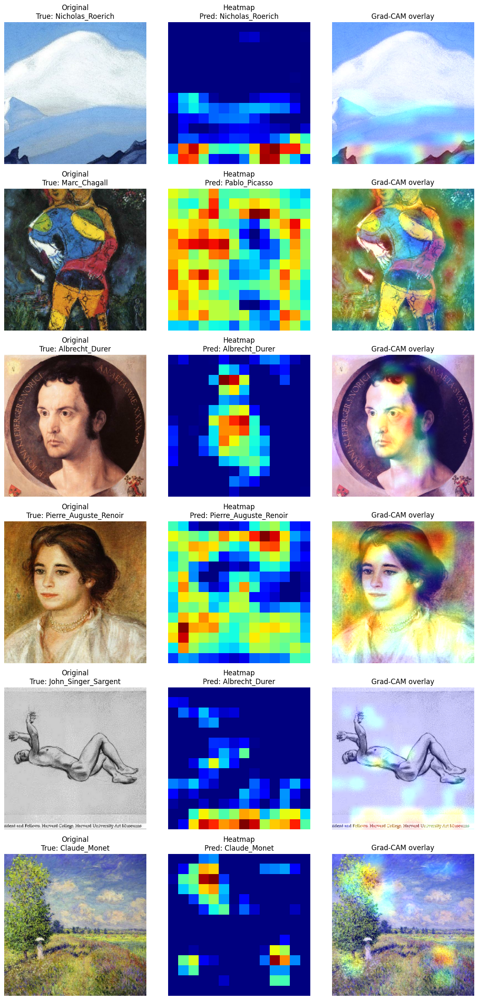

In [51]:
# Pick one image from a validation batch
for batch_images, batch_labels in val_ds.take(1):
    break

n_show = 6
fig, axes = plt.subplots(n_show, 3, figsize=(12, 4 * n_show))

for i in range(n_show):
    img_tensor = batch_images[i]
    true_label = int(batch_labels[i].numpy())
    img_array = tf.expand_dims(img_tensor, axis=0)

    heatmap, pred_idx, pred_probs = make_gradcam_heatmap(
        img_array,
        model_5block_L2,
        last_conv_layer_name="conv2d_17"
    )

    overlay = overlay_gradcam(img_tensor.numpy(), heatmap)

    axes[i, 0].imshow(img_tensor.numpy().astype("uint8"))
    axes[i, 0].set_title(f"Original\nTrue: {class_names[true_label]}")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(heatmap, cmap="jet")
    axes[i, 1].set_title(f"Heatmap\nPred: {class_names[pred_idx]}")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(overlay)
    axes[i, 2].set_title("Grad-CAM overlay")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

## 5. Apply best model to test

In [46]:
test_results = evaluate_model(model_5blocks_aug, test_ds, class_names, "Test" )


Test Results:
  Weighted F1: 0.6784
  Macro F1:    0.6589

Per-class report:
                       precision    recall  f1-score   support

       Albrecht_Durer       0.73      0.80      0.76       116
      Boris_Kustodiev       0.45      0.47      0.46        89
     Camille_Pissarro       0.57      0.56      0.57       124
        Childe_Hassam       0.56      0.55      0.55        77
         Claude_Monet       0.71      0.72      0.72       187
          Edgar_Degas       0.52      0.62      0.57        85
        Eugene_Boudin       0.60      0.82      0.70        78
         Gustave_Dore       0.97      0.91      0.94       105
           Ilya_Repin       0.43      0.39      0.41        75
      Ivan_Aivazovsky       0.83      0.84      0.83        81
        Ivan_Shishkin       0.72      0.82      0.77        73
  John_Singer_Sargent       0.74      0.59      0.66       110
         Marc_Chagall       0.70      0.65      0.68       107
      Martiros_Saryan       0.52      0